# FICO challenge dataset
## 1: Clean Data and and build FFNN

In [1]:
import pickle
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import plotly.express as px
import scipy.sparse
import os

# import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
import tensorflow.keras.backend as K

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix

In [2]:
print(tf.__version__)

RESULT_PATH = './results'

if not os.path.exists(RESULT_PATH):
        os.mkdir(RESULT_PATH)

1.15.0


In [3]:
data = pd.read_csv("Data/heloc_dataset_v1.csv")
print(data.shape)
data.head()

(10459, 24)


,RiskPerformance,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
0,Bad,55,144,4,84,20,3,0,83,2,...,43,0,0,0,33,-8,8,1,1,69
1,Bad,61,58,15,41,2,4,4,100,-7,...,67,0,0,0,0,-8,0,-8,-8,0
2,Bad,67,66,5,24,9,0,0,100,-7,...,44,0,4,4,53,66,4,2,1,86
3,Bad,66,169,1,73,28,1,1,93,76,...,57,0,5,4,72,83,6,4,3,91
4,Bad,81,333,27,132,12,0,0,100,-7,...,25,0,1,1,51,89,3,1,0,80


In [4]:
# import pandas_profiling
# profile = pandas_profiling.ProfileReport(data, minimal=False)
# profile

In [5]:
dups = data.duplicated(subset=None, keep='first')
data[dups]['RiskPerformance'].value_counts()

Bad     323
Good    264
Name: RiskPerformance, dtype: int64

Of the 588 duplicates (all -9 values, i.e. not found at bureaux) there's a 55% bad rate

In [6]:
# Save target y and dummy the X matrix

CLASS = 'RiskPerformance'

# Split X and y
X = data.drop(columns=[CLASS])
y = data[CLASS]
class_names = sorted(y.unique(),  reverse=True)

y.value_counts()

Bad     5459
Good    5000
Name: RiskPerformance, dtype: int64

Encode y

In [7]:
# from sklearn.preprocessing import LabelEncoder
# encoder = LabelEncoder()
# encoder.fit(y)
# y_onehot = encoder.transform(y)
# y_onehot = 1-y_onehot

y_onehot = pd.get_dummies(y)[['Bad']]
np.array(np.unique(y_onehot, return_counts=True)).T

array([[   0, 5000],
       [   1, 5459]], dtype=int64)

### Scale X

In [8]:
# Scale the Training Data Matrix

# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler(feature_range=(-1, 1), copy=True)

# from sklearn.preprocessing import RobustScaler
# scaler = RobustScaler()

## Standard Scaler is best performin
# from sklearn.preprocessing import StandardScaler
# scaler = StandardScaler()
# scaler.fit(data.values)
# X = scaler.transform(data.values)

## No scaling
# X = data.values



### Alternatively, Bin X following the Chen, lin, Rudin segmentations

In [30]:
input_names = list(X.columns)
input_names_bin = [x + '_bin' for x in input_names]

X1 = pd.DataFrame()

# ExternalRiskEstimate
X1[input_names_bin[0]]=pd.cut(x=X[input_names[0]], 
                                      bins=[-float("inf"),-9,-8,-7,63,70,75,80,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[0]].value_counts(sort=True)

# TradeOpenTime
X1[input_names_bin[1]]=pd.cut(x=X[input_names[1]], 
                                      bins=[-float("inf"),-9,-8,-7,91,134,263,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[1]].value_counts(sort=True)


X1[input_names_bin[2]]=pd.cut(x=X[input_names[2]], 
                                      bins=[-float("inf"),-9,-8,-7,19,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[2]].value_counts(sort=True)

X1[input_names_bin[3]]=pd.cut(x=X[input_names[3]], 
                                      bins=[-float("inf"),-9,-8,-7,48,69,96,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[3]].value_counts(sort=True)

# NumSatisfactoryTrades
X1[input_names_bin[4]]=pd.cut(x=X[input_names[4]], 
                                      bins=[-float("inf"),-9,-8,-7,2,5,12,21,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[4]].value_counts(sort=True)

# TradeFrequency
X1[input_names_bin[5]]=pd.cut(x=X[input_names[5]], 
                                      bins=[-float("inf"),-9,-8,-7,1,2,11,12,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[5]].value_counts(sort=True)

X1[input_names_bin[6]]=pd.cut(x=X[input_names[6]], 
                                      bins=[-float("inf"),-9,-8,-7,1,7,9,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[6]].value_counts(sort=True)

X1[input_names_bin[11]]=pd.cut(x=X[input_names[11]], 
                                      bins=[-float("inf"),-9,-8,-7,0,9,16,27,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[11]].value_counts(sort=True)


X1[input_names_bin[12]]=pd.cut(x=X[input_names[12]], 
                                      bins=[-float("inf"),-9,-8,-7,2,3,6,11,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[12]].value_counts(sort=True)

# Delinquency
X1[input_names_bin[7]]=pd.cut(x=X[input_names[7]], 
                                      bins=[-float("inf"),-9,-8,-7,59,84,89,96,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[7]].value_counts(sort=True)

X1[input_names_bin[8]]=pd.cut(x=X[input_names[8]], 
                                      bins=[-float("inf"),-9,-8,-7,17,32,47,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[8]].value_counts(sort=True)

X1[input_names_bin[9]]=pd.cut(x=X[input_names[9]], 
                                      bins=[-float("inf"),-9,-8,-7,5,6,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[9]].value_counts(sort=True)

X1[input_names_bin[10]]=pd.cut(x=X[input_names[10]], 
                                      bins=[-float("inf"),-9,-8,-7,2,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[10]].value_counts(sort=True)

# Installment
X1[input_names_bin[13]]=pd.cut(x=X[input_names[13]], 
                                      bins=[-float("inf"),-9,-8,-7,35,46,57,84,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[13]].value_counts(sort=True)

X1[input_names_bin[18]]=pd.cut(x=X[input_names[18]], 
                                      bins=[-float("inf"),-9,-8,-7,35,70,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[18]].value_counts(sort=True)

X1[input_names_bin[20]]=pd.cut(x=X[input_names[20]], 
                                      bins=[-float("inf"),-9,-8,-7,2,3,11,13,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[20]].value_counts(sort=True)


#Inquiry
X1[input_names_bin[14]]=pd.cut(x=X[input_names[14]], 
                                      bins=[-float("inf"),-9,-8,-7,0,2,8,22,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[14]].value_counts(sort=True)

X1[input_names_bin[15]]=pd.cut(x=X[input_names[15]], 
                                      bins=[-float("inf"),-9,-8,-7,1,4,8,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[15]].value_counts(sort=True)

X1[input_names_bin[16]]=pd.cut(x=X[input_names[16]], 
                                      bins=[-float("inf"),-9,-8,-7,2,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[16]].value_counts(sort=True)

# Revolving balance
X1[input_names_bin[17]]=pd.cut(x=X[input_names[17]], 
                                      bins=[-float("inf"),-9,-8,-7,14,37,72,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[17]].value_counts(sort=True)

X1[input_names_bin[19]]=pd.cut(x=X[input_names[19]], 
                                      bins=[-float("inf"),-9,-8,-7,3,4,7,11,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[19]].value_counts(sort=True)

# Utilisation
X1[input_names_bin[21]]=pd.cut(x=X[input_names[21]], 
                                      bins=[-float("inf"),-9,-8,-7,1,2,3,5,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[21]].value_counts(sort=True)

# Trade with balance
X1[input_names_bin[22]]=pd.cut(x=X[input_names[22]], 
                                      bins=[-float("inf"),-9,-8,-7,47,66,73,86,float("inf")]
#                                       ,labels=["1.799", "1.017", "0.269","-0.326"]
                                     )
X1[input_names_bin[22]].value_counts(sort=True)
print(X1.columns.values)
X1.head()

['ExternalRiskEstimate_bin' 'MSinceOldestTradeOpen_bin'
 'MSinceMostRecentTradeOpen_bin' 'AverageMInFile_bin'
 'NumSatisfactoryTrades_bin' 'NumTrades60Ever2DerogPubRec_bin'
 'NumTrades90Ever2DerogPubRec_bin' 'NumTotalTrades_bin'
 'NumTradesOpeninLast12M_bin' 'PercentTradesNeverDelq_bin'
 'MSinceMostRecentDelq_bin' 'MaxDelq2PublicRecLast12M_bin'
 'MaxDelqEver_bin' 'PercentInstallTrades_bin'
 'NetFractionInstallBurden_bin' 'NumInstallTradesWBalance_bin'
 'MSinceMostRecentInqexcl7days_bin' 'NumInqLast6M_bin'
 'NumInqLast6Mexcl7days_bin' 'NetFractionRevolvingBurden_bin'
 'NumRevolvingTradesWBalance_bin' 'NumBank2NatlTradesWHighUtilization_bin'
 'PercentTradesWBalance_bin']


,ExternalRiskEstimate_bin,MSinceOldestTradeOpen_bin,MSinceMostRecentTradeOpen_bin,AverageMInFile_bin,NumSatisfactoryTrades_bin,NumTrades60Ever2DerogPubRec_bin,NumTrades90Ever2DerogPubRec_bin,NumTotalTrades_bin,NumTradesOpeninLast12M_bin,PercentTradesNeverDelq_bin,...,PercentInstallTrades_bin,NetFractionInstallBurden_bin,NumInstallTradesWBalance_bin,MSinceMostRecentInqexcl7days_bin,NumInqLast6M_bin,NumInqLast6Mexcl7days_bin,NetFractionRevolvingBurden_bin,NumRevolvingTradesWBalance_bin,NumBank2NatlTradesWHighUtilization_bin,PercentTradesWBalance_bin
0,"(-7.0, 63.0]","(134.0, 263.0]","(-7.0, 19.0]","(69.0, 96.0]","(12.0, 21.0]","(2.0, 11.0]","(-7.0, 1.0]","(16.0, 27.0]","(-7.0, 2.0]","(59.0, 84.0]",...,"(35.0, 46.0]","(-9.0, -8.0]","(-7.0, 2.0]","(-7.0, 0.0]","(-7.0, 1.0]","(-7.0, 2.0]","(14.0, 37.0]","(7.0, 11.0]","(-7.0, 1.0]","(66.0, 73.0]"
1,"(-7.0, 63.0]","(-7.0, 91.0]","(-7.0, 19.0]","(-7.0, 48.0]","(-7.0, 2.0]","(2.0, 11.0]","(1.0, 7.0]","(0.0, 9.0]","(-7.0, 2.0]","(96.0, inf]",...,"(57.0, 84.0]","(-9.0, -8.0]","(-9.0, -8.0]","(-7.0, 0.0]","(-7.0, 1.0]","(-7.0, 2.0]","(-7.0, 14.0]","(-7.0, 3.0]","(-9.0, -8.0]","(-7.0, 47.0]"
2,"(63.0, 70.0]","(-7.0, 91.0]","(-7.0, 19.0]","(-7.0, 48.0]","(5.0, 12.0]","(-7.0, 1.0]","(-7.0, 1.0]","(0.0, 9.0]","(3.0, 6.0]","(96.0, inf]",...,"(35.0, 46.0]","(35.0, 70.0]","(-7.0, 2.0]","(-7.0, 0.0]","(1.0, 4.0]","(2.0, inf]","(37.0, 72.0]","(3.0, 4.0]","(-7.0, 1.0]","(73.0, 86.0]"
3,"(63.0, 70.0]","(134.0, 263.0]","(-7.0, 19.0]","(69.0, 96.0]","(21.0, inf]","(-7.0, 1.0]","(-7.0, 1.0]","(27.0, inf]","(2.0, 3.0]","(89.0, 96.0]",...,"(46.0, 57.0]","(70.0, inf]","(3.0, 11.0]","(-7.0, 0.0]","(4.0, 8.0]","(2.0, inf]","(37.0, 72.0]","(4.0, 7.0]","(2.0, 3.0]","(86.0, inf]"
4,"(80.0, inf]","(263.0, inf]","(19.0, inf]","(96.0, inf]","(5.0, 12.0]","(-7.0, 1.0]","(-7.0, 1.0]","(9.0, 16.0]","(-7.0, 2.0]","(96.0, inf]",...,"(-7.0, 35.0]","(70.0, inf]","(-7.0, 2.0]","(-7.0, 0.0]","(-7.0, 1.0]","(-7.0, 2.0]","(37.0, 72.0]","(-7.0, 3.0]","(-7.0, 1.0]","(73.0, 86.0]"


## OHE binned variables

One hot encode

In [31]:
# One-hot
run_one_hot = False
if run_one_hot:
    # data_onehot = pd.get_dummies(data)
    X_onehot = pd.get_dummies(X1)
    y_onehot = pd.get_dummies(y)[['Bad']]
    print(np.array(np.unique(y_onehot, return_counts=True)).T)

    X_train, X_test, y_train, y_test, X_onehot_train, X_onehot_test, y_onehot_train, y_onehot_test, = \
    train_test_split(X1, y, X_onehot, y_onehot, test_size = .25, random_state = 2020, shuffle = True)
    print(X_onehot_train.shape, X_onehot_test.shape, y_onehot_train.shape, y_onehot_test.shape)

In [32]:
# X_onehot_train = scipy.sparse.csc_matrix(X_onehot_train.to_numpy())
# X_onehot_test = scipy.sparse.csc_matrix(X_onehot_test.to_numpy())

## Alternatively, input WoE like in Rudin et al

In [38]:
df2= X1.copy()
df2['Y'] = y_onehot

In [34]:
from tqdm import tqdm

d4 = pd.DataFrame()

for x in tqdm(X1.columns.values):
#     print(x)
#     print(df2.groupby(x).count().Y.to_frame().reset_index())
    d3 = df2.groupby(x).count().Y.to_frame().reset_index()
    d3['EVENT'] = df2.groupby(x).sum().reset_index()['Y']
    d3.insert(loc=0, column='Feature', value=np.repeat(x,len(df2.groupby(x).count().Y))  )    
    d3.columns = ['Feature', 'Bin', 'Count', 'Event']
    d3['Non_Event'] = d3['Count'] - d3['Event']
    d3["Event_Rate"] = d3['Event']/d3['Count']
    d3["Non_Event_Rate"] = d3['Non_Event']/d3['Count']
   
    d3["DIST_EVENT"] = d3['Event']/d3.groupby('Feature').sum()['Event'].to_numpy()
    d3["DIST_NON_EVENT"] = d3['Non_Event']/d3.groupby('Feature').sum()['Non_Event'].to_numpy()
#     d3['Feat'] = d3['Feature'].astype(str) +"_"+d3['Bin'].astype(str) 
    d3["WOE"] = np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT-d3.DIST_NON_EVENT)*np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)

#     print(d3)
    
    d4 = d4.append(d3)
    



100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [00:22<00:00,  1.01it/s]


In [35]:
d4[d4['Feature'] == 'NumTrades60Ever2DerogPubRec_bin']
# d4.to_csv("WOE_bins_v5.csv", index=False)

In [36]:
csv = "WOE_bins_v5.csv"
# csv = "synth_nonlinear.csv"
d4 = pd.read_csv(csv)

In [40]:
def WOE_apply(df, woe_df, feat_var, bin_var, woe_var):
    d5 = woe_df[[feat_var, bin_var,woe_var]]
    d5 = d5.replace([np.inf], 1.).replace([-np.inf], -1.)
    # var = 'NumTrades60Ever2DerogPubRec_bin'
    transform_suffix = 'WOE'

    for var in tqdm(X1.columns.values):

    #     print(var)
        small_df = d5[woe_df[feat_var] == var]
        transform_dict = dict(zip(small_df[bin_var],small_df[woe_var]))
        replace_cmd1 = ''
    #     print(transform_dict)

        for i in sorted(transform_dict.items()):
    #         print(i)
            replace_cmd1 = replace_cmd1 + str(i[1]) + str(' if str(x) == "') + str(i[0]) + '" else '
        replace_cmd1 = replace_cmd1 + '0'
    #     print(replace_cmd1)
        if replace_cmd1 != '0':
            try:
    #             print(df2[var].astype(str).apply(lambda x: eval(replace_cmd1)))
                df[var + '_' +transform_suffix] = df[var].astype(str).apply(lambda x: eval(replace_cmd1))
            except:
                'something wrong'
    return df

df_woe = WOE_apply(df2, d4, 'Feature', 'Bin', 'WOE')
df_woe = WOE_apply(df2, d4, 'Feature', 'Bin', 'WOE_Rud')
df_woe

100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [00:10<00:00,  2.15it/s]


,ExternalRiskEstimate_bin,MSinceOldestTradeOpen_bin,MSinceMostRecentTradeOpen_bin,AverageMInFile_bin,NumSatisfactoryTrades_bin,NumTrades60Ever2DerogPubRec_bin,NumTrades90Ever2DerogPubRec_bin,NumTotalTrades_bin,NumTradesOpeninLast12M_bin,PercentTradesNeverDelq_bin,...,PercentInstallTrades_bin_WOE,NetFractionInstallBurden_bin_WOE,NumInstallTradesWBalance_bin_WOE,MSinceMostRecentInqexcl7days_bin_WOE,NumInqLast6M_bin_WOE,NumInqLast6Mexcl7days_bin_WOE,NetFractionRevolvingBurden_bin_WOE,NumRevolvingTradesWBalance_bin_WOE,NumBank2NatlTradesWHighUtilization_bin_WOE,PercentTradesWBalance_bin_WOE
0,"(-7.0, 63.0]","(134.0, 263.0]","(-7.0, 19.0]","(69.0, 96.0]","(12.0, 21.0]","(2.0, 11.0]","(-7.0, 1.0]","(16.0, 27.0]","(-7.0, 2.0]","(59.0, 84.0]",...,-0.503,0.047,0.242,1.223,-0.047,-0.051,-0.088,0.034,-0.601,-0.130
1,"(-7.0, 63.0]","(-7.0, 91.0]","(-7.0, 19.0]","(-7.0, 48.0]","(-7.0, 2.0]","(2.0, 11.0]","(1.0, 7.0]","(0.0, 9.0]","(-7.0, 2.0]","(96.0, inf]",...,0.161,0.047,0.256,1.223,-0.047,-0.051,-0.739,-0.188,0.601,-0.982
2,"(63.0, 70.0]","(-7.0, 91.0]","(-7.0, 19.0]","(-7.0, 48.0]","(5.0, 12.0]","(-7.0, 1.0]","(-7.0, 1.0]","(0.0, 9.0]","(3.0, 6.0]","(96.0, inf]",...,-0.503,0.147,0.242,1.223,0.170,0.021,0.633,-0.263,-0.601,0.203
3,"(63.0, 70.0]","(134.0, 263.0]","(-7.0, 19.0]","(69.0, 96.0]","(21.0, inf]","(-7.0, 1.0]","(-7.0, 1.0]","(27.0, inf]","(2.0, 3.0]","(89.0, 96.0]",...,-0.145,0.363,0.313,1.223,0.471,0.021,0.633,-0.150,0.541,0.772
4,"(80.0, inf]","(263.0, inf]","(19.0, inf]","(96.0, inf]","(5.0, 12.0]","(-7.0, 1.0]","(-7.0, 1.0]","(9.0, 16.0]","(-7.0, 2.0]","(96.0, inf]",...,-0.620,0.363,0.242,1.223,-0.047,-0.051,0.633,-0.188,-0.601,0.203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10454,"(70.0, 75.0]","(91.0, 134.0]","(-7.0, 19.0]","(48.0, 69.0]","(12.0, 21.0]","(-7.0, 1.0]","(-7.0, 1.0]","(16.0, 27.0]","(3.0, 6.0]","(89.0, 96.0]",...,-0.620,0.047,0.242,0.305,-0.047,-0.051,-0.088,-0.150,-0.601,0.772
10455,"(63.0, 70.0]","(134.0, 263.0]","(19.0, inf]","(48.0, 69.0]","(5.0, 12.0]","(-7.0, 1.0]","(-7.0, 1.0]","(9.0, 16.0]","(-7.0, 2.0]","(89.0, 96.0]",...,-0.503,0.147,0.242,0.553,-0.047,-0.051,1.457,-0.188,-0.601,0.203
10456,"(70.0, 75.0]","(91.0, 134.0]","(-7.0, 19.0]","(48.0, 69.0]","(12.0, 21.0]","(-7.0, 1.0]","(-7.0, 1.0]","(16.0, 27.0]","(-7.0, 2.0]","(96.0, inf]",...,-0.620,0.047,0.256,0.305,0.170,0.021,-0.739,-0.150,-0.601,-0.454
10457,"(70.0, 75.0]","(134.0, 263.0]","(-7.0, 19.0]","(96.0, inf]","(21.0, inf]","(1.0, 2.0]","(1.0, 7.0]","(27.0, inf]","(-7.0, 2.0]","(89.0, 96.0]",...,-0.620,0.047,0.242,0.305,-0.047,-0.051,-0.088,-0.263,-0.601,-0.982


In [41]:
df3 = df_woe.drop([col for col in df_woe.columns if 'WOE' not in col],axis=1)
df3

,ExternalRiskEstimate_bin_WOE,MSinceOldestTradeOpen_bin_WOE,MSinceMostRecentTradeOpen_bin_WOE,AverageMInFile_bin_WOE,NumSatisfactoryTrades_bin_WOE,NumTrades60Ever2DerogPubRec_bin_WOE,NumTrades90Ever2DerogPubRec_bin_WOE,NumTotalTrades_bin_WOE,NumTradesOpeninLast12M_bin_WOE,PercentTradesNeverDelq_bin_WOE,...,PercentInstallTrades_bin_WOE,NetFractionInstallBurden_bin_WOE,NumInstallTradesWBalance_bin_WOE,MSinceMostRecentInqexcl7days_bin_WOE,NumInqLast6M_bin_WOE,NumInqLast6Mexcl7days_bin_WOE,NetFractionRevolvingBurden_bin_WOE,NumRevolvingTradesWBalance_bin_WOE,NumBank2NatlTradesWHighUtilization_bin_WOE,PercentTradesWBalance_bin_WOE
0,1.799,0.086,0.083,0.269,0.166,0.952,-0.021,-0.097,-0.021,1.012,...,-0.503,0.047,0.242,1.223,-0.047,-0.051,-0.088,0.034,-0.601,-0.130
1,1.799,0.549,0.083,1.238,1.999,0.952,-0.053,0.535,-0.021,-0.147,...,0.161,0.047,0.256,1.223,-0.047,-0.051,-0.739,-0.188,0.601,-0.982
2,1.017,0.549,0.083,1.238,0.539,-0.021,-0.021,0.535,0.428,-0.147,...,-0.503,0.147,0.242,1.223,0.170,0.021,0.633,-0.263,-0.601,0.203
3,1.017,0.086,0.083,0.269,-0.086,-0.021,-0.021,-0.377,0.287,0.366,...,-0.145,0.363,0.313,1.223,0.471,0.021,0.633,-0.150,0.541,0.772
4,-1.094,-0.148,0.000,0.000,0.539,-0.021,-0.021,0.116,-0.021,-0.147,...,-0.620,0.363,0.242,1.223,-0.047,-0.051,0.633,-0.188,-0.601,0.203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10454,0.269,0.292,0.083,0.669,0.166,-0.021,-0.021,-0.097,0.428,0.366,...,-0.620,0.047,0.242,0.305,-0.047,-0.051,-0.088,-0.150,-0.601,0.772
10455,1.017,0.086,0.000,0.669,0.539,-0.021,-0.021,0.116,-0.021,0.366,...,-0.503,0.147,0.242,0.553,-0.047,-0.051,1.457,-0.188,-0.601,0.203
10456,0.269,0.292,0.083,0.669,0.166,-0.021,-0.021,-0.097,-0.021,-0.147,...,-0.620,0.047,0.256,0.305,0.170,0.021,-0.739,-0.150,-0.601,-0.454
10457,0.269,0.086,0.083,0.000,-0.086,0.931,-0.053,-0.377,-0.021,0.366,...,-0.620,0.047,0.242,0.305,-0.047,-0.051,-0.088,-0.263,-0.601,-0.982


In [42]:
X_train, X_test, y_train, y_test = \
train_test_split(df3, y_onehot, test_size = .25, random_state = 2020, shuffle = True)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(7844, 23) (2615, 23) (7844, 1) (2615, 1)


## Save the transformed data

In [44]:
cwd = os.getcwd()
print(cwd)

C:\Users\brizio\Documents\PythonNB\FICOchallenge


In [45]:
os.chdir(cwd)
save_d = True
if save_d == True:
    # Save modified data (to save column names etc.)
    df3.to_csv("./Data/WOE_Rud_data.csv", index=False)
#     y.to_csv("./Data/y_data.csv", index=False)

## Train a Keras MLP

In [14]:
# def recall_m(y_true, y_pred):
#         true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
#         possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
#         recall = true_positives / (possible_positives + K.epsilon())
#         return recall

# def precision_m(y_true, y_pred):
#         true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
#         predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
#         precision = true_positives / (predicted_positives + K.epsilon())
#         return precision

In [15]:
# model = Sequential()
# model.add(Dense(10, input_dim=len(X_onehot_train.values[0])))
# model.add(Activation("relu"))
# model.add(Dense(1))
# model.add(Activation("sigmoid"))

# model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy',recall_m,precision_m])

# model.fit(X_onehot_train.values, y_onehot_train, epochs=50, batch_size=10)

# scores = model.evaluate(X_onehot_train.values, y_onehot_train)
# print("Training Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

# scores = model.evaluate(X_onehot_test.values, y_onehot_test)
# print("Test Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

### Model Loading and/or Training

[<tensorflow.python.keras.layers.core.Dense object at 0x000001C759EE4D08>, <tensorflow.python.keras.layers.normalization.BatchNormalization object at 0x000001C759EE7A48>, <tensorflow.python.keras.layers.core.Dense object at 0x000001C759EEA8C8>]
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 10)                240       
_________________________________________________________________
batch_normalization_1 (Batch (None, 10)                40        
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 11        
Total params: 291
Trainable params: 271
Non-trainable params: 20
_________________________________________________________________

Epoch 00001: val_loss improved from inf to 0.65636, saving model to ./results\net_WOE_rudin.h5

Epoch 00002: val_loss improved from 0.65636

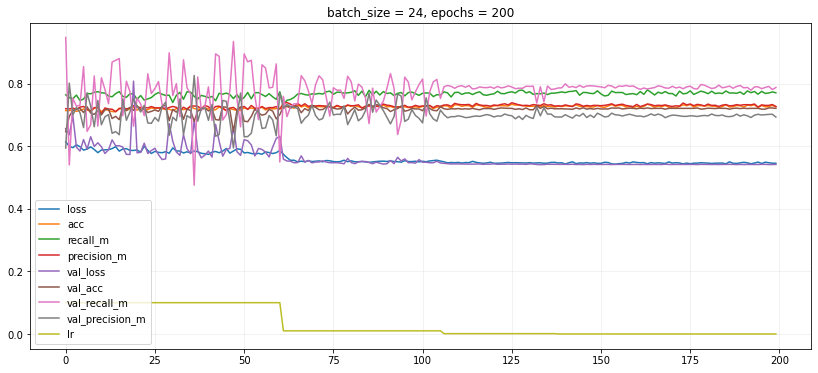

In [48]:
# Model Creation
from tensorflow.keras.models import Sequential, Model 
from keras.layers import Dense, Embedding, Conv1D, MaxPooling1D, GlobalMaxPool1D, Flatten, Input, concatenate, Dropout, Activation, regularizers, BatchNormalization

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision


def get_FFNN_model(X, y, hidden_layers_size = [4]):
    """
        BASIC MODEL for the FF-NN
    """
    input_size = len(X.columns.values)
    output_size = len(y.columns.values)
    
    if len(hidden_layers_size) == 0:
        # No hidden layer (linear regression equivalent)
        ff_layers = [ Dense(output_size, input_shape=(input_size,), activation='softmax') ]
    else:
        # With sigmoid hidden layers        
        ff_layers = [
            tf.keras.layers.Dense(hidden_layers_size[0], input_shape=(input_size,), activation='sigmoid',
                  kernel_initializer='he_uniform',
#                   bias_initializer = 'zeros',
                  kernel_regularizer=regularizers.l1(0.001)
#                   ,activity_regularizer=regularizers.l2(0.001)
                 ),
            tf.keras.layers.BatchNormalization(),  # <- Batch normalisation layer
#             Dropout(0.3),
#             Dense(10, activation = 'sigmoid',
#                   kernel_initializer='ones',
#                   kernel_regularizer=regularizers.l1(0.005),
#                   activity_regularizer=regularizers.l2(0.001)
#                  ),
#             Dense(hidden_layers_size[0], input_shape=(input_size,), activation='relu', activity_regularizer=regularizers.l1_l2(l1=0.01, l2=0.01)),
#             Dense(hidden_layers_size[0], input_shape=(input_size,), activation='sigmoid', activity_regularizer=regularizers.l1_l2(l1=0.01, l2=0.01)),
#             tf.keras.layers.Dense(20, input_shape=(input_size,), activation='sigmoid'),
#             Activation('relu'),
            tf.keras.layers.Dense(output_size, activation='sigmoid') 
        ]
#         for hidden_size in hidden_layers_size[1:]:  
#             ff_layers.insert( -1,  Dense(hidden_size, activation='tanh') )
#             ff_layers.insert( -1,  Activation('relu') )
            
            
    print(ff_layers)
    model = tf.keras.models.Sequential(ff_layers)
    model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.1),
                  loss='binary_crossentropy',
                  metrics=['accuracy',recall_m,precision_m])
    model.summary()
    return model

# Model Training
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

EPOCHS = 200
PATIENCE = 50
BATCH_SIZE = 24

def net_train(model, bestmodel_path, X_train, y_train_onehot, X_validate, y_validate_onehot, epochs = EPOCHS):
    # Define four callbacks to use
    checkpointer = ModelCheckpoint(filepath = bestmodel_path, verbose = 2, save_best_only = True, save_weights_only=False)
    early_stopping = EarlyStopping(monitor = 'val_acc', patience = PATIENCE, mode = 'max')
    learning_rate_reduction = ReduceLROnPlateau(monitor = 'loss', factor = 0.1, patience = 20, verbose = 2)

    # Train the model
    history = model.fit(X_train, y_train_onehot, verbose = False, epochs=epochs, batch_size=BATCH_SIZE, 
                        callbacks=[
                            checkpointer,
#                             early_stopping, 
                            learning_rate_reduction
                        ], 
#                         validation_data=(X_validate, y_validate_onehot)
                        validation_split = 0.2
                       )

    return history


HIDDEN_LAYERS = [10]

model = get_FFNN_model(X_train, y_onehot, HIDDEN_LAYERS)

model_path = os.path.join(RESULT_PATH, 'net_WOE_rudin.h5')
forge_gen = True

if not os.path.exists(model_path) or forge_gen:
    history = net_train(model, model_path, X_train, y_train, X_test, y_test)    
    
    score = model.evaluate(X_test, y_test)
    plt.figure(figsize=(14,6))
    for key in history.history.keys():
        plt.plot(history.history[key], label=key)
    plt.legend(loc='best')
    plt.grid(alpha=.2)
    plt.title(f'batch_size = {BATCH_SIZE}, epochs = {EPOCHS}')
    plt.draw()
else:
    print('Model loaded.')
    model.load_weights(model_path)

In [49]:
# scores = model.evaluate(X_onehot_train.values, y_onehot_train)
scores = model.evaluate(X_train, y_train, verbose=0)
print("Training Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

# scores = model.evaluate(X_onehot_test.values, y_onehot_test)
scores = model.evaluate(X_test, y_test, verbose = 0)
print("Test Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

confusion_matrix(y_test, model.predict_classes(X_test), sample_weight=None)

Training Set: 
acc: 73.50%
Test Set: 
acc: 72.62%


array([[ 813,  411],
       [ 305, 1086]], dtype=int64)

## Load Weights and Architecture

In [53]:
from tensorflow.keras.models import load_model
def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

new_model = load_model(checkpoint_dir,  compile=False)
new_model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.1),
                  loss='binary_crossentropy',
                  metrics=['accuracy',recall_m,precision_m])

def get_train_test_accuracy(model):
    # scores = model.evaluate(X_onehot_train.values, y_onehot_train)
    scores = model.evaluate(X_onehot_train, y_onehot_train, verbose=0)
    print("Training Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

    # scores = model.evaluate(X_onehot_test.values, y_onehot_test)
    scores = model.evaluate(X_onehot_test, y_onehot_test, verbose = 0)
    print("Test Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

get_train_test_accuracy(new_model)

Training Set: 
acc: 73.57%
Test Set: 
acc: 72.20%


In [70]:
checkpoint_dir = os.path.join('results')
latest = tf.train.latest_checkpoint(checkpoint_dir)
print(latest)


None


### AutoKeras

In [36]:
# basic data preparation
from sklearn.preprocessing import LabelEncoder
X = X_onehot.astype('int8')
y = LabelEncoder().fit_transform(y_onehot['Bad'].astype('int8'))

X_onehot_train, X_onehot_test, y_onehot_train, y_onehot_test, = \
train_test_split(X, y, test_size = .25, random_state = 2020, shuffle = True)
print(X_onehot_train.shape, X_onehot_test.shape, y_onehot_train.shape, y_onehot_test.shape)


from autokeras import StructuredDataClassifier
# define the search
search = StructuredDataClassifier(max_trials=15)
# perform the search
search.fit(x=X_onehot_train, y=y_onehot_train, verbose=1)
# evaluate the model
# loss, acc = search.evaluate(X_onehot_test, y_onehot_test, verbose=1)

Trial 15 Complete [00h 02m 33s]
val_accuracy: 0.7097402811050415

Best val_accuracy So Far: 0.7318181991577148
Total elapsed time: 00h 11m 39s
INFO:tensorflow:Oracle triggered exit
Epoch 1/3
246/246 [==============================] - 3s 3ms/step - loss: 0.6277 - accuracy: 0.6417
Epoch 2/3
246/246 [==============================] - 1s 3ms/step - loss: 0.5553 - accuracy: 0.7195
Epoch 3/3
246/246 [==============================] - 1s 3ms/step - loss: 0.5374 - accuracy: 0.7308
INFO:tensorflow:Assets written to: .\structured_data_classifier\best_model\assets


In [ ]:
search.evaluate(X_onehot_test, y_onehot_test, verbose=0);

In [ ]:
# get the best performing model
model = search.export_model()
# summarize the loaded model
model.summary()

In [ ]:
# save the best performing model to file
model.save('model_auto.h5',save_format='tf')

### Numeric variables

In [51]:
# basic data preparation
from sklearn.preprocessing import LabelEncoder
X = X.astype('float32')
y = LabelEncoder().fit_transform(y_onehot['Bad'].astype('int8'))

X_onehot_train, X_onehot_test, y_onehot_train, y_onehot_test, = \
train_test_split(X, y, test_size = .25, random_state = 2020, shuffle = True)
print(X_onehot_train.shape, X_onehot_test.shape, y_onehot_train.shape, y_onehot_test.shape)


from autokeras import StructuredDataClassifier
# define the search
search = StructuredDataClassifier(max_trials=15)
# perform the search
search.fit(x=X_onehot_train, y=y_onehot_train, verbose=1)
# evaluate the model
# loss, acc = search.evaluate(X_onehot_test, y_onehot_test, verbose=1)

Trial 15 Complete [00h 00m 15s]
val_accuracy: 0.7032467722892761

Best val_accuracy So Far: 0.7233766317367554
Total elapsed time: 00h 08m 31s
INFO:tensorflow:Oracle triggered exit
Epoch 1/19
246/246 [==============================] - 1s 2ms/step - loss: 0.6983 - accuracy: 0.5768
Epoch 2/19
246/246 [==============================] - 1s 3ms/step - loss: 0.6150 - accuracy: 0.6765
Epoch 3/19
246/246 [==============================] - 1s 3ms/step - loss: 0.6088 - accuracy: 0.6881
Epoch 4/19
246/246 [==============================] - 1s 3ms/step - loss: 0.6048 - accuracy: 0.6998
Epoch 5/19
246/246 [==============================] - 1s 3ms/step - loss: 0.5995 - accuracy: 0.6924
Epoch 6/19
246/246 [==============================] - 1s 3ms/step - loss: 0.5938 - accuracy: 0.6968
Epoch 7/19
246/246 [==============================] - 1s 3ms/step - loss: 0.5851 - accuracy: 0.7067
Epoch 8/19
246/246 [==============================] - 1s 3ms/step - loss: 0.5852 - accuracy: 0.7029
Epoch 9/19
246/246 

In [ ]:
search.evaluate(X_onehot_test, y_onehot_test, verbose=1);

In [ ]:
# get the best performing model
model = search.export_model()
# summarize the loaded model
model.summary()

In [ ]:
# save the best performing model to file
model.save('model_num_auto.h5',save_format='tf')

In [94]:
# scores = model.evaluate(X_onehot_train.values, y_onehot_train)
scores = model.evaluate(X_onehot_train, y_onehot_train, verbose=0)
print("Training Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

# scores = model.evaluate(X_onehot_test.values, y_onehot_test)
scores = model.evaluate(X_onehot_test, y_onehot_test, verbose = 0)
print("Test Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

# confusion_matrix(y_onehot_test, model.predict_classes(X_onehot_test), sample_weight=None)

Training Set: 
acc: 66.39%
Test Set: 
acc: 66.35%


### WoE variables

In [64]:
# basic data preparation
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import preprocessing
X = df3.astype('float32')
y = LabelEncoder().fit_transform(y_onehot['Bad'].astype('int8'))

X_onehot_train, X_onehot_test, y_onehot_train, y_onehot_test, = \
train_test_split(X, y, test_size = .25, random_state = 2020, shuffle = True)
print(X_onehot_train.shape, X_onehot_test.shape, y_onehot_train.shape, y_onehot_test.shape)


from autokeras import StructuredDataClassifier
# define the search
search = StructuredDataClassifier(max_trials=20)
# perform the search
search.fit(x=X_onehot_train, y=y_onehot_train, verbose=1)
# evaluate the model
# loss, acc = search.evaluate(X_onehot_test, y_onehot_test, verbose=1)

(7844, 23) (2615, 23) (7844,) (2615,)


ImportError: cannot import name 'preprocessing' from 'tensorflow.keras.layers.experimental' (C:\Users\brizio\Anaconda3\lib\site-packages\tensorflow_core\python\keras\api\_v1\keras\layers\experimental\__init__.py)

In [38]:
search.evaluate(X_onehot_test, y_onehot_test, verbose=1);

82/82 [==============================] - 0s 1ms/step - loss: 0.5710 - accuracy: 0.7059


In [39]:
# get the best performing model
model = search.export_model()
# summarize the loaded model
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 23)]              0         
_________________________________________________________________
multi_category_encoding (Mul (None, 23)                0         
_________________________________________________________________
normalization (Normalization (None, 23)                47        
_________________________________________________________________
dense (Dense)                (None, 256)               6144      
_________________________________________________________________
re_lu (ReLU)                 (None, 256)               0         
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                8224  

In [40]:
# save the best performing model to file
model.save('model_WOE_auto',save_format='tf')

INFO:tensorflow:Assets written to: model_WOE_auto\assets


In [41]:
# scores = model.evaluate(X_onehot_train.values, y_onehot_train)
scores = model.evaluate(X_onehot_train, y_onehot_train, verbose=0)
print("Training Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

# scores = model.evaluate(X_onehot_test.values, y_onehot_test)
scores = model.evaluate(X_onehot_test, y_onehot_test, verbose = 0)
print("Test Set:", "\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

# confusion_matrix(y_onehot_test, model.predict_classes(X_onehot_test), sample_weight=None)

Training Set: 
accuracy: 73.36%
Test Set: 
accuracy: 70.59%


#### Convolutional net

In [30]:
# # fit and evaluate a model
# def evaluate_model(trainX, trainy, testX, testy, n_kernel):
# 	verbose, epochs, batch_size = 1, 10, 10
# 	n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
# 	model = Sequential()
# 	model.add(Conv1D(filters=10, kernel_size=n_kernel, activation='relu', input_shape=(n_timesteps,n_features)))
# # 	model.add(Conv1D(filters=64, kernel_size=n_kernel, activation='relu'))
# 	model.add(Dropout(0.5))
# 	model.add(MaxPooling1D(pool_size=2))
# 	model.add(Flatten())
# 	model.add(Dense(10, activation='relu'))
# 	model.add(Dense(n_outputs, activation='softmax'))
# 	model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# 	# fit network
# 	model.fit(trainX, trainy, epochs=epochs, batch_size=batch_size, verbose=verbose)
# 	# evaluate model
# 	_, accuracy = model.evaluate(testX, testy, batch_size=batch_size, verbose=0)
# 	return accuracy
 
# # summarize scores
# def summarize_results(scores, params):
# 	print(scores, params)
# 	# summarize mean and standard deviation
# 	for i in range(len(scores)):
# 		m, s = mean(scores[i]), std(scores[i])
# 		print('Param=%d: %.3f%% (+/-%.3f)' % (params[i], m, s))
# 	# boxplot of scores
# 	pyplot.boxplot(scores, labels=params)
# 	pyplot.savefig('exp_cnn_kernel.png')
 
# # run an experiment
# def run_experiment(params, repeats=10):
# 	# load data
# 	trainX, trainy, testX, testy = np.expand_dims(X_onehot_train,axis=2) ,y_onehot_train , np.expand_dims(X_onehot_test,axis=2) , y_onehot_test
# 	# test each parameter
# 	all_scores = list()
# 	for p in params:
# 		# repeat experiment
# 		scores = list()
# 		for r in range(repeats):
# 			score = evaluate_model(trainX, trainy, testX, testy, p)
# 			score = score * 100.0
# 			print('>p=%d #%d: %.3f' % (p, r+1, score))
# 			scores.append(score)
# 		all_scores.append(scores)
# 	# summarize results
# 	summarize_results(all_scores, params)
 
# # run the experiment
# n_params = [2]
# run_experiment(n_params)

In [100]:
baseline_model_accuracy = model.evaluate(
    X_onehot_test, y_onehot_test, verbose=0)[1]

print('Baseline test accuracy:', baseline_model_accuracy)

Baseline test accuracy: 0.72275335


### Pruning

In [104]:
run = True
if run is not None:
    import tensorflow_model_optimization as tfmot

    prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude

    # Compute end step to finish pruning after 2 epochs.
    validation_split = .25 # 10% of training set will be used for validation set. 

    num_images = X_onehot_train.shape[0] * (1 - validation_split)
    end_step = np.ceil(num_images / BATCH_SIZE).astype(np.int32) * EPOCHS
    initial_sparsity = 0.001
    final_sparsity = 0.0001

    print(end_step,initial_sparsity,final_sparsity)

    # Define model for pruning.
    pruning_params = {
          'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(initial_sparsity=initial_sparsity,
                                                                   final_sparsity=final_sparsity,
                                                                   begin_step=0,
                                                                   end_step=end_step)
    }

    model_for_pruning = prune_low_magnitude(model, **pruning_params)

    # `prune_low_magnitude` requires a recompile.
    model_for_pruning.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy',recall_m,precision_m])

    model_for_pruning.summary()
    
    import tempfile
    logdir = tempfile.mkdtemp()
    EPOCHS = 3


    callbacks = [
      tfmot.sparsity.keras.UpdatePruningStep(),
      tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
    ]

    model_for_pruning.fit(X_onehot_train, y_onehot_train,
                      batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=validation_split,
                      callbacks=callbacks)
    
    # strip dropped parameters and evaluate accuracy
    model_for_export = tfmot.sparsity.keras.strip_pruning(model_for_pruning)

    model_for_export.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model_for_pruning_accuracy = model_for_export.evaluate(
       X_onehot_test, y_onehot_test, verbose=0)[1]

    print('Baseline test accuracy:', baseline_model_accuracy)
    print('Pruned test accuracy:', model_for_pruning_accuracy)

276 0.001 0.0001
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
prune_low_magnitude_dense_10 (None, 10)                3712      
_________________________________________________________________
prune_low_magnitude_batch_no (None, 10)                41        
_________________________________________________________________
prune_low_magnitude_dense_11 (None, 1)                 23        
Total params: 3,776
Trainable params: 1,891
Non-trainable params: 1,885
_________________________________________________________________
Train on 5883 samples, validate on 1961 samples
Epoch 1/3
5883/5883 [==============================] - 2s 260us/sample - loss: 0.6288 - acc: 0.7178 - recall_m: 0.7542 - precision_m: 0.7215 - val_loss: 0.7146 - val_acc: 0.6512 - val_recall_m: 0.9392 - val_precision_m: 0.5988
Epoch 2/3
5883/5883 [==============================] - 1s 111us/sample - loss: 0.6218 

### XGBoost

In [74]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

xgb = XGBClassifier()
xgb.fit(X_onehot_train, y_onehot_train)
# make predictions for test data
y_pred = xgb.predict(X_onehot_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_onehot_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[17:57:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 69.87%


In [ ]:
# Using a random forest to optimize
# import scikit_optimize as skopt
from skopt import forest_minimize

def tune_xgbc(params):
# Implementation learned on a lesson of Mario Filho (Kagle Grandmaster) for parametes optmization.
# Link to the video: https://www.youtube.com/watch?v=WhnkeasZNHI

    """Function to be passed as scikit-optimize minimizer/maximizer input

    Parameters:
    Tuples with information about the range that the optimizer should use for that parameter, 
    as well as the behaviour that it should follow in that range.

    Returns:
    float: the metric that should be minimized. If the objective is maximization, then the negative 
    of the desired metric must be returned. In this case, the negative AUC average generated by CV is returned.
    """


    #Hyperparameters to be optimized
    print(params)
    learning_rate = params[0] 
    n_estimators = params[1] 
    max_depth = params[2]
    min_child_weight = params[3]
    gamma = params[4]
    subsample = params[5]
    colsample_bytree = params[6]


    #Model to be optimized
    mdl = XGBClassifier(learning_rate = learning_rate, 
                            n_estimators = n_estimators, 
                            max_depth = max_depth, 
                            min_child_weight = min_child_weight, 
                            gamma = gamma, 
                            subsample = subsample, 
                            colsample_bytree = colsample_bytree, seed = 42)


    #Cross-Validation in order to avoid overfitting
    auc = cross_val_score(mdl, X_onehot_train, y_onehot_train, cv = 10, scoring = 'roc_auc')

    print(auc.mean())
    # as the function is minimization (forest_minimize), we need to use the negative of the desired metric (AUC)
    return -auc.mean()

# Creating a sample space in which the initial randomic search should be performed
space = [(1e-3, 1e-1, 'log-uniform'), # learning rate
          (100, 2000), # n_estimators
          (1, 10), # max_depth 
          (1, 6.), # min_child_weight 
          (0, 0.5), # gamma 
          (0.5, 1.), # subsample 
          (0.5, 1.)] # colsample_bytree 

# Minimization using a random forest with 20 random samples and 50 iterations for Bayesian optimization.
result = forest_minimize(tune_xgbc, space, random_state = 42, n_random_starts = 20, n_calls  = 25, verbose = 1)

In [84]:
result.x

[0.0026587543983272693,
 1315,
 5,
 4.087407548138583,
 0.3058265802441405,
 0.5035331526098588,
 0.5115312125207079]

In [88]:
xgb1 = XGBClassifier(learning_rate = result.x[0], 
                     n_estimators = result.x[1], 
                     max_depth = result.x[2], 
                     min_child_weight = result.x[3], 
                     gamma = result.x[4], 
                     subsample = result.x[5], 
                     colsample_bytree = result.x[6], 
                     seed = 42)


xgb1.fit(X_onehot_train, y_onehot_train)
# make predictions for test data
y_pred = xgb1.predict(X_onehot_test)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_onehot_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[09:39:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 72.12%


In [ ]:
from sklearn import preprocessing
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb

CLASS = 'RiskPerformance'

# Split X and y
X = data.drop(columns=[CLASS])
y = data[CLASS]
y_onehot = pd.get_dummies(y)[['Bad']]

np.array(np.unique(y_onehot, return_counts=True)).T
X = X.astype('float32')
y = LabelEncoder().fit_transform(y_onehot['Bad'].astype('int8'))

X_onehot_train, X_onehot_test, y_onehot_train, y_onehot_test, = \
train_test_split(X, y, test_size = .25, random_state = 2020, shuffle = True)
print(X_onehot_train.shape, X_onehot_test.shape, y_onehot_train.shape, y_onehot_test.shape)

RS = RobustScaler()
scaledX = RS.fit_transform(X_onehot_train)
scaledX = pd.DataFrame(X_onehot_train, columns = X_onehot_train.columns)
colList = X_onehot_train.columns

scaledX_test = pd.DataFrame(RS.transform(X_onehot_test), columns = X_onehot_test.columns)

params = {"verbosity":0,
          "nthread":-1,
          "seed":1,
          "booster":"gbtree",
          "lambda":1,
          "alpha":0,
          "learning_rate":0.0085,
          "gamma":0.642,
          "max_depth":16,
          "min_child_weight":5,
          "max_delta_step":2,
          "subsample":0.374,
          "colsample_bytree":0.8280000000000001,
          "colsample_bylevel":1,
          "scale_pos_weight":1,
          "process_type":"default",
          "tree_method":"auto",
          "objective":"binary:logistic",
          "eval_metric":'auc'}

import scipy.sparse

dtrain = xgb.DMatrix(scipy.sparse.csc_matrix(scaledX.to_numpy()), label = y_onehot_train, feature_names = colList)

dtest  = xgb.DMatrix(scipy.sparse.csc_matrix(scaledX_test.to_numpy()), label = y_onehot_test, feature_names = colList)

# evallist = (dtrain, 'train')
xg_reg = xgb.train(params, dtrain, 750,  [(dtrain,'train'),(dtest,'test')])

In [120]:
# make predictions for test data
y_pred = xg_reg.predict(dtest)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_onehot_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 53.23%


In [ ]:
# Using a random forest to optimize
# import scikit_optimize as skopt
from skopt import forest_minimize

def tune_xgbc(params):
# Implementation learned on a lesson of Mario Filho (Kagle Grandmaster) for parametes optmization.
# Link to the video: https://www.youtube.com/watch?v=WhnkeasZNHI

    """Function to be passed as scikit-optimize minimizer/maximizer input

    Parameters:
    Tuples with information about the range that the optimizer should use for that parameter, 
    as well as the behaviour that it should follow in that range.

    Returns:
    float: the metric that should be minimized. If the objective is maximization, then the negative 
    of the desired metric must be returned. In this case, the negative AUC average generated by CV is returned.
    """


    #Hyperparameters to be optimized
    print(params)
    learning_rate = params[0] 
    gamma = params[1] 
    max_depth = params[2]
    min_child_weight = params[3]
    max_delta_step = params[4]
    subsample = params[5]
    colsample_bytree = params[6]
    rounds = params[7]

    params1 = {"silent":1,
              "nthread":-1,
              "seed":1,
              "booster":"gbtree",
              "lambda":1,
              "alpha":0,
              "learning_rate":learning_rate,
              "gamma":gamma,
              "max_depth":max_depth,
              "min_child_weight":min_child_weight,
              "max_delta_step":max_delta_step,
              "subsample":subsample,
              "colsample_bytree":colsample_bytree,
              "colsample_bylevel":1,
              "scale_pos_weight":1,
              "process_type":"default",
              "tree_method":"auto",
              "objective":"binary:logistic",
              "eval_metric":'auc'}


    #Model to be optimized
    mdl = xgb.train(params1, dtrain, rounds,  [(dtrain,'train'),(dtest,'test')])


    #Cross-Validation in order to avoid overfitting
    auc = xgb.cv(params1, dtrain, nfold  = 10, metrics = 'auc')

    print(auc.mean()[2])
    # as the function is minimization (forest_minimize), we need to use the negative of the desired metric (AUC)
    return -auc.mean()[2]

# Creating a sample space in which the initial randomic search should be performed
space = [(1e-3, 1e-1, 'log-uniform'), # learning rate
          (0, 0.5), # gamma
          (1, 30), # max_depth 
          (1, 6.), # min_child_weight 
          (0, 5), # max_delta_step 
          (0.5, 1.), # subsample 
          (0.5, 1.), # colsample_bytree 
          (10,1000)] # rounds

# Minimization using a random forest with 20 random samples and 50 iterations for Bayesian optimization.
result = forest_minimize(tune_xgbc, space, random_state = 42, n_random_starts = 20, n_calls  = 25, verbose = 1)

In [121]:
result.x

[0.04947535032796275,
 0.27261958736380937,
 6,
 3.064296866484532,
 4,
 0.6680047054202385,
 0.9831620375498387,
 156]

In [122]:
learning_rate = result.x[0] 
gamma = result.x[1] 
max_depth = result.x[2]
min_child_weight = result.x[3]
max_delta_step = result.x[4]
subsample = result.x[5]
colsample_bytree = result.x[6]
rounds = result.x[7]

params1 = {"silent":1,
          "nthread":-1,
          "seed":1,
          "booster":"gbtree",
          "lambda":1,
          "alpha":0,
          "learning_rate":learning_rate,
          "gamma":gamma,
          "max_depth":max_depth,
          "min_child_weight":min_child_weight,
          "max_delta_step":max_delta_step,
          "subsample":subsample,
          "colsample_bytree":colsample_bytree,
          "colsample_bylevel":1,
          "scale_pos_weight":1,
          "process_type":"default",
          "tree_method":"auto",
          "objective":"binary:logistic",
          "eval_metric":'auc'}

mdl = xgb.train(params1, dtrain, rounds,  [(dtrain,'train'),(dtest,'test')])

# make predictions for test data
y_pred = mdl.predict(dtest)
predictions = [round(value) for value in y_pred]
# evaluate predictions
accuracy = accuracy_score(y_onehot_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

[0]	train-auc:0.79507	test-auc:0.50277
[1]	train-auc:0.80696	test-auc:0.51860
[2]	train-auc:0.81502	test-auc:0.51386
[3]	train-auc:0.81821	test-auc:0.53876
[4]	train-auc:0.82074	test-auc:0.55240
[5]	train-auc:0.82293	test-auc:0.55316
[6]	train-auc:0.82524	test-auc:0.54122
[7]	train-auc:0.82687	test-auc:0.53702
[8]	train-auc:0.82805	test-auc:0.53702
[9]	train-auc:0.82877	test-auc:0.52892
[10]	train-auc:0.83034	test-auc:0.53534
[11]	train-auc:0.83231	test-auc:0.53307
[12]	train-auc:0.83368	test-auc:0.53607
[13]	train-auc:0.83436	test-auc:0.53100
[14]	train-auc:0.83565	test-auc:0.56098
[15]	train-auc:0.83632	test-auc:0.56276
[16]	train-auc:0.83734	test-auc:0.57935
[17]	train-auc:0.83751	test-auc:0.57944
[18]	train-auc:0.83832	test-auc:0.55937
[19]	train-auc:0.83939	test-auc:0.56898
[20]	train-auc:0.84054	test-auc:0.56722
[21]	train-auc:0.84147	test-auc:0.57966
[22]	train-auc:0.84176	test-auc:0.57997
[23]	train-auc:0.84302	test-auc:0.55693
[24]	train-auc:0.84416	test-auc:0.55703
[25]	train

### Basic Fucntions Extractions

In [48]:
intermediate_layer_idx = 0
features_func = K.function([model.layers[0].input],[model.layers[intermediate_layer_idx].output])
dense_W0 = model.layers[0].get_weights()[0]
dense_W1 = model.layers[1].get_weights()[0]
# dense_W2 = model.layers[2].get_weights()[0]
dense_W0.shape, dense_W1.shape #, dense_W2.shape
denseW = dense_W0
layeract = model.layers[intermediate_layer_idx].activation

In [49]:
def num_all_filters():
    return HIDDEN_LAYERS[0]

## Elements for Global Explanations

In [50]:
import matplotlib.pyplot as plt

ATTACK = '-'
SUPPORT = '+'
NEUTRAL = '0'
NON_SUPPORT = '+~'
NON_ATTACK = '-~'
CRITICAL_ATTACK = '-!'
CRITICAL_SUPPORT = '+!'
RELATIONS = [SUPPORT, ATTACK, NEUTRAL, CRITICAL_SUPPORT, CRITICAL_ATTACK]

COLORS = {
    ATTACK: plt.get_cmap("tab20b")([13])[0],
    SUPPORT: plt.get_cmap("tab20c")([9])[0],
    CRITICAL_ATTACK: plt.get_cmap("tab20b")([13])[0],
    CRITICAL_SUPPORT: plt.get_cmap("tab20")([0])[0],
    NEUTRAL: plt.get_cmap("tab20c")([18])[0],
    NON_SUPPORT: plt.get_cmap("tab20c")([11])[0],
    NON_ATTACK: plt.get_cmap("tab20b")([15])[0],
}

def get_type(val):
    if val > 0:
        return SUPPORT
    elif val < 0:
        return ATTACK
    else:
        return NEUTRAL

### Calculate Statistics

In [51]:
input_name = list(X_onehot.columns)
HIDDEN_LAYERS = [10]

stats_weights = [
    pd.DataFrame([
        {
            'name':'_'.join(input_name.split('_(')[:-1]),
            'value': '('+input_name.split('_(')[-1],
            'score': val,
            'score_abs': np.abs(val),
            'type': get_type(val), 
#             'score_perc': val / dense_W0[:,feature_idx].sum()
        }
        for val, input_name in zip(denseW[:,feature_idx], X_onehot_train.columns.values) if val != 0 
    ]).sort_values(['score'], ascending = False).reset_index(drop = True).to_dict('records')
    for feature_idx in range(num_all_filters())
]

# Global Explanation

In [52]:
import matplotlib as mpl
mpl.rcParams['font.size'] = 14

COLORS_WEIGHTS = {
    ATTACK: plt.get_cmap("tab20b")([14])[0],
    SUPPORT: plt.get_cmap("tab20c")([9])[0],
    NEUTRAL: plt.get_cmap("tab20c")([18])[0],
}

# Funtion to plot the pie chart of the single feature
def plot_feature(feature_idx, stats_weights = stats_weights, pie_size = 0.75, pie_radius = 1, top = None):
    sts = stats_weights[feature_idx]
    if top is not None:
        if isinstance(top, int):
            sts = [s for s in sts[:top] if s['type'] == SUPPORT] + [s for s in sts[-top:] if s['type'] == ATTACK]
        else:
            raise Exception('Invalid top parameter.')
        
    vals, labels, colors = [], [], []
    for i, d in enumerate(sts):
        vals.append(d['score_abs'])
        labels.append(f"{d['name']} = {d['value']}")
        colors.append(COLORS_WEIGHTS[d['type']])
    # Pie
    wedges, texts = plt.pie(vals, normalize= True, radius=pie_radius, colors=colors, wedgeprops=dict(width=pie_size, edgecolor='w'), startangle = 180 - sum([d['score_abs'] for i, d in enumerate(sts) if d['type'] == SUPPORT]) / sum([d['score_abs'] for i, d in enumerate(sts)]) * 360)
    # Annotations
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    kw = dict(arrowprops=dict(arrowstyle="-"), bbox=bbox_props, zorder=0, va="center")
    for i, p in enumerate(wedges):
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = "angle,angleA=0,angleB={}".format(ang)
        kw["arrowprops"].update({"connectionstyle": connectionstyle})
        plt.gca().annotate(labels[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                    horizontalalignment=horizontalalignment, **kw)
    # Aspect & Title
    plt.gca().set(aspect="equal")
    plt.title(f'Feature {feature_idx}')
    
# UI components from ipywidgets
import ipywidgets as wgt

def update_feature_visualization(feature_idx, top):
    plt.figure(figsize = [12, 12])
    plot_feature(feature_idx, top = top)
    plt.show()
    
def visualize_features():
    widgets = {
        'hide_feature_desc': wgt.HTML(value = '<b>Intermediate Feature</b><br /><b>(Hidden Neuron)</b>'), 
        'feature_idx': wgt.RadioButtons(options=list(range(num_all_filters())), value=0, description='Neuron:'),
        'hide_nmb_rels': wgt.HTML(value = '<b>Number of relations</b><br /><b>(Attacks/Supports)</b>'), 
        
        'top': wgt.IntSlider(value = 10, min = 1, max = 50, step = 1, description='Number:'),
    }
    
    buttons = wgt.VBox([wid for arg, wid in widgets.items()])
    out = wgt.interactive_output(update_feature_visualization, {arg: wid for arg, wid in widgets.items() if 'hide_' not in arg})
    display(wgt.HBox([buttons, out]))

In [53]:
visualize_features()

# Local Explanation

## Relevance extraction

In [66]:
import innvestigate
from innvestigate.utils import model_wo_softmax

lrp_type = 'lrp.epsilon'
# lrp_type = 'lrp.alpha_2_beta_1'


def create_full_relevance_model(model, intermediate_layer_idx):
    return model

full_relevance_model = create_full_relevance_model(model, intermediate_layer_idx)
display(full_relevance_model.summary())
output_relevance_analyzer = innvestigate.create_analyzer(lrp_type, full_relevance_model, neuron_selection_mode="index")

def get_input_to_output_relevance(x_onehot):
    return output_relevance_analyzer.analyze(np.array([x_onehot]), 0)[0]

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 10)                1860      
_________________________________________________________________
batch_normalization_3 (Batch (None, 10)                40        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 11        
Total params: 1,911
Trainable params: 1,891
Non-trainable params: 20
_________________________________________________________________


None

In [67]:
import innvestigate
from innvestigate.utils import model_wo_softmax

def create_intermediate_to_output_model(model, intermediate_layer_idx):
    newinput = x = keras.layers.Input(shape=K.int_shape(model.layers[intermediate_layer_idx].output)[1:])
    for layer in model.layers[intermediate_layer_idx+1:]:
        x = layer(x)
    return keras.Model(inputs=[newinput],outputs=[x])

feature_extraction_model = create_intermediate_to_output_model(model, intermediate_layer_idx)
display(feature_extraction_model.summary())
feature_relevance_analyzer = innvestigate.create_analyzer(lrp_type, feature_extraction_model, neuron_selection_mode="index")

def get_feature_to_output_relevance(x_onehot):
    return feature_relevance_analyzer.analyze(features_func([np.array([x_onehot])])[0], 0)[0]

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 10)                0         
_________________________________________________________________
batch_normalization_3 (Batch (None, 10)                40        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 11        
Total params: 51
Trainable params: 31
Non-trainable params: 20
_________________________________________________________________


None

In [68]:
import innvestigate
from innvestigate.utils import model_wo_softmax

def create_input_to_intermediate_model(model, intermediate_layer_idx):
    return keras.Model(inputs=[model.input],outputs=[model.layers[intermediate_layer_idx].output])

input_extraction_model = create_input_to_intermediate_model(model, intermediate_layer_idx)
display(input_extraction_model.summary())
input_relevance_analyzer = innvestigate.create_analyzer(lrp_type, input_extraction_model, neuron_selection_mode="index")

def get_input_to_feature_relevance(x_onehot):
    input_relevance = []
    for filter_idx in range(num_all_filters()):
        input_relevance.append( np.expand_dims(input_relevance_analyzer.analyze(np.array([x_onehot]), filter_idx)[0], axis = -1) )
    return np.concatenate(input_relevance, axis = -1)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5_input (InputLayer)   (None, 185)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 10)                1860      
Total params: 1,860
Trainable params: 1,860
Non-trainable params: 0
_________________________________________________________________


None

In [69]:
# import scipy.stats
# import time
# i = 0
# t = []
# for _ in range(1500):
#     x_onehot = X_onehot_test.values[i]
#     # Predict
#     start = time.time()
#     probs = model.predict(np.array([x_onehot]))[0]
#     t.append(time.time()-start)
#     t[-1] = t[-1]
#     i+=1
# stat = pd.DataFrame(t).describe()
# mu, sigma = stat.loc['mean',0], stat.loc['std',0]
# display(stat)
# confs = scipy.stats.norm.interval(0.95, loc=mu, scale=sigma)
# conf = (confs[1] - confs[0])/2
# print(f'{mu} +/- {conf}')

In [70]:
# from ann_visualizer.visualize import ann_viz;

# ann_viz(model, title="My first neural network")

## Sample

In [71]:
idx = 131
# idx = 329
# idx = 1468 # Bad but in train
# idx = 3291 # Good but in train
print(X_test.loc[idx])
x = X_onehot_test.loc[idx]
x_onehot = X_onehot_test.loc[idx].values
prob = model.predict(np.array([x_onehot]))[0][0] 
print(prob)
class_idx = (prob > .5) * 1
class_name = class_names[class_idx]
print(class_name)
class_name, class_idx
feature_acts = features_func([np.array([x_onehot])])[0][0]
relevance_intermediate = get_feature_to_output_relevance(x_onehot)
print('feature_acts',feature_acts)
print('relevance_intermediate',relevance_intermediate)

ExternalRiskEstimate_bin                    (0.0, 63.0]
MSinceOldestTradeOpen_bin                 (91.0, 134.0]
MSinceMostRecentTradeOpen_bin               (0.0, 19.0]
AverageMInFile_bin                         (69.0, 96.0]
NumSatisfactoryTrades_bin                  (12.0, 21.0]
NumTrades60Ever2DerogPubRec_bin              (0.0, 1.0]
NumTrades90Ever2DerogPubRec_bin             (-7.0, 0.0]
NumTotalTrades_bin                         (16.0, 27.0]
NumTradesOpeninLast12M_bin                   (0.0, 2.0]
PercentTradesNeverDelq_bin                 (59.0, 84.0]
MSinceMostRecentDelq_bin                    (0.0, 17.0]
MaxDelq2PublicRecLast12M_bin                 (0.0, 5.0]
MaxDelqEver_bin                              (2.0, inf]
PercentInstallTrades_bin                   (46.0, 57.0]
NetFractionInstallBurden_bin               (-9.0, -8.0]
NumInstallTradesWBalance_bin                 (0.0, 2.0]
MSinceMostRecentInqexcl7days_bin           (-8.0, -7.0]
NumInqLast6M_bin                             (1.

In [72]:
weights_df_list = [
        pd.DataFrame([
        {
            'name':'_'.join(input_name.split('_(')[:-1]),
            'value': '('+input_name.split('_(')[-1],
            'score': val,
            'score_abs': np.abs(val),
            'type': get_type(val), 
#             'score_perc': val / dense_W0[:,feature_idx].sum()
        }
        for val, input_name in zip(denseW[:,feature_idx], X_onehot_train.columns.values) if val != 0 
    ])
    for feature_idx in range(num_all_filters())
]

input_relevance = get_input_to_feature_relevance(x_onehot)
weights_df_list_relev = [
        pd.DataFrame([
        {
            'name':'_'.join(input_name.split('_(')[:-1]),
            'value': '('+input_name.split('_(')[-1],
            'score': val,
            'score_abs': np.abs(val),
            'type': get_type(val), 
#             'score_perc': val / dense_W0[:,feature_idx].sum()
        }
        for val, input_name in zip(input_relevance[:,feature_idx], X_onehot_train.columns.values) 
    ])
    for feature_idx in range(num_all_filters())
]

In [73]:
# mpl.rcParams.update(mpl.rcParamsDefault)

feature_idx = 0
def plot_all_weight_for_input(feature_idx, input_name, relevance = False, debug = False):
    mpl.rcParams.update({'figure.autolayout': True})
    width = 0.8
    
    weights_df = weights_df_list[feature_idx]
    heights = list(map(float, weights_df[weights_df['name']==input_name]['score']))
    bars = list(weights_df[weights_df['name']==input_name]['value'])
    y_pos = range(len(bars))
    plt.bar(y_pos, heights, width=width)
    
    if relevance:
        weights_dfrel = weights_df_list_relev[feature_idx]
        heights1 = list(map(float, weights_dfrel[weights_dfrel['name']==input_name]['score']))
        bars1 = list(weights_dfrel[weights_dfrel['name']==input_name]['value'])
        heights2 = (np.array(bars) == np.array(bars1)).astype(int)*heights1
        plt.bar(y_pos,   heights1, width=width*0.5, color='r', alpha=0.5)

    # Rotation of the bars names
    plt.xticks(y_pos, bars, rotation=90)
    plt.savefig(f"{input_name}_{feature_idx}.png");

    if debug:
        for bars,heights in zip(bars,heights):
            print(bars,heights)

        for bars1,heights1 in zip(bars1,heights1):
            print(bars1,heights1)

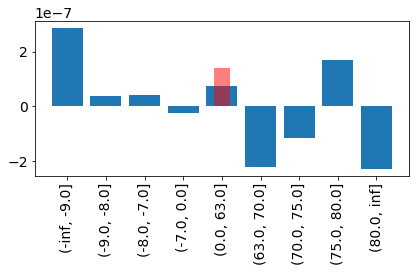

In [74]:
filter_idx = 0
plot_all_weight_for_input(filter_idx, input_name = 'ExternalRiskEstimate_bin', relevance = True , debug = False)

In [75]:
CLASS

'RiskPerformance'

In [76]:
debug = False
# def generate_Xprime(x):
#     X_prime = []
#     x_variation = []
#     for col in X.columns.values:
#         for un in X[col].unique():
#             if un != x[col]:
#                 x_prime = x.copy()
#                 x_prime[col] = un
#                 X_prime.append(x_prime)
#                 x_variation.append(col)
#     X_prime = pd.DataFrame(X_prime)
#     X_prime = pd.get_dummies(X_prime)
#     x_variation = np.array(x_variation)
#     X_primes = {col : X_prime.iloc[x_variation == col] for col in X.columns.values}
#     return X_primes    

def generate_featprime(feature_acts):
    feature_acts_primes = []
    for i in range(len(feature_acts)):
        feature_acts_prime = feature_acts.copy()
        feature_acts_prime[i] = 0
        feature_acts_primes.append(feature_acts_prime)
    return np.array(feature_acts_primes)

def generate_af_counterfactual(idx, strong = True):
#     x = X_test.iloc[idx]
    x_onehot = X_onehot_test.loc[idx].values
    prob = model.predict(np.array([x_onehot]))[0][0] 
    class_idx = (prob > .5) * 1
    class_name = class_names[class_idx]
    feature_acts = features_func([np.array([x_onehot])])[0][0]
    relevance_current_class = get_feature_to_output_relevance(x_onehot)
#     print(relevance_current_class)
    
    G = nx.DiGraph()
    class_node = f'{CLASS}\n{class_name}'
    G.add_node(class_node, level = 2, relevance = relevance_current_class.sum(), label = CLASS + ' = ' + class_name + "\n (prob = %.1f%%)" % (prob*100))
    
    feature_acts_prime = generate_featprime(feature_acts)
    pre_soft_prime = feature_extraction_model.predict(feature_acts_prime)
    critical_supports_feature = ((pre_soft_prime > .5) * 1).flatten() != class_idx
    
#     X_primes = generate_Xprime(x)
    
    for filter_idx in range(len(feature_acts)):
        if critical_supports_feature[filter_idx]:
            G.add_node(filter_idx, type = CRITICAL_SUPPORT, relevance = np.abs(relevance_current_class[filter_idx]), level = 1, label = 'Hidden Neuron ' + str(filter_idx)+ "\n (R = %.2f)" % (relevance_current_class[filter_idx]))
            G.add_edge(filter_idx, class_node, type = CRITICAL_SUPPORT, relevance = np.abs(relevance_current_class[filter_idx]), level = 1)
        elif relevance_current_class[filter_idx] > 0:
            G.add_node(filter_idx, type = SUPPORT, relevance = np.abs(relevance_current_class[filter_idx]), level = 1, label = 'Hidden Neuron ' + str(filter_idx) + "\n (R = %.2f)" % (relevance_current_class[filter_idx]))
            G.add_edge(filter_idx, class_node, type = SUPPORT, relevance = np.abs(relevance_current_class[filter_idx]), level = 1)
        elif relevance_current_class[filter_idx] < 0:
            G.add_node(filter_idx, type = ATTACK, relevance = np.abs(relevance_current_class[filter_idx]), level = 1, label = 'Hidden Neuron ' + str(filter_idx)+ "\n (R = %.2f)" % (relevance_current_class[filter_idx]))
            G.add_edge(filter_idx, class_node, type = ATTACK, relevance = np.abs(relevance_current_class[filter_idx]), level = 1)
#         elif relevance_current_class[filter_idx] == 0:
#             G.add_node(filter_idx, relevance = np.abs(relevance_current_class[filter_idx]), level = 1)
#             G.add_edge(filter_idx, class_node, type = NEUTRAL, level = 1)
        
    input_relevance = np.array(get_input_to_feature_relevance(x_onehot))
    
    for filter_idx in [node for node in G.nodes if G.nodes[node]['level'] == 1]:
        for c, col in enumerate(X_onehot.columns.values):
            label = f"{'_'.join(col.split('_')[:-1])} = {col.split('_')[-1]}"
#             val = denseW[c,filter_idx] / denseW[:,filter_idx].sum() * np.abs(relevance_current_class[filter_idx])
            val = input_relevance[c,filter_idx] / np.abs(input_relevance[:,filter_idx]).sum()
            if input_relevance[c,filter_idx] > 0 and x_onehot[c] > 0:
                if debug:
                    print(filter_idx,col,SUPPORT,val,input_relevance[c,filter_idx],input_relevance[:,filter_idx].sum(),np.abs(relevance_current_class[filter_idx]))
                G.add_node((filter_idx, col),             type = SUPPORT, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
                G.add_edge((filter_idx, col), filter_idx, type = SUPPORT, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
            elif input_relevance[c,filter_idx] < 0 and x_onehot[c] > 0:
                if debug:
                    print(filter_idx,col,ATTACK,val,input_relevance[c,filter_idx],input_relevance[:,filter_idx].sum(),np.abs(relevance_current_class[filter_idx]))
                G.add_node((filter_idx, col),             type = ATTACK, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
                G.add_edge((filter_idx, col), filter_idx, type = ATTACK, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
            elif input_relevance[c,filter_idx] > 0:
                if debug:
                    print(filter_idx,col,NON_SUPPORT,val,input_relevance[c,filter_idx],input_relevance[:,filter_idx].sum(),np.abs(relevance_current_class[filter_idx]))
                G.add_node((filter_idx, col),             type = NON_SUPPORT, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
                G.add_edge((filter_idx, col), filter_idx, type = NON_SUPPORT, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
            elif input_relevance[c,filter_idx] < 0:
                if debug:
                    print(filter_idx,col,NON_ATTACK,val,input_relevance[c,filter_idx],input_relevance[:,filter_idx].sum(),np.abs(relevance_current_class[filter_idx]))
                G.add_node((filter_idx, col),             type = NON_ATTACK, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
                G.add_edge((filter_idx, col), filter_idx, type = NON_ATTACK, level = 0, relevance = np.abs( input_relevance[c,filter_idx]), label = label)
#             elif denseW[c,filter_idx] == 0:
#                 G.add_node((filter_idx, col),             type = NEUTRAL, level = 0, relevance = np.abs(denseW[c,filter_idx]), label = label)
#                 G.add_edge((filter_idx, col), filter_idx, type = NEUTRAL, level = 0, relevance = np.abs(denseW[c,filter_idx]), label = label)
            
#     for c, col in enumerate(X.columns.values):
#         X_prime = X_primes[col]
#         feature_acts_prime = features_func([X_prime.values])[0]

#         critical_supports_input = (np.tile(feature_acts, (len(X_prime), 1)) > 0) & (feature_acts_prime <= 0)
#         critical_attacks_input = (np.tile(feature_acts, (len(X_prime), 1)) <= 0) & (feature_acts_prime > 0)
#         cr_sup_sum = critical_supports_input.sum(0)
#         cr_att_sum = critical_attacks_input.sum(0)

#         label = f"{col}_{x[col]}"

#         for filter_idx in [node for node in G.nodes if G.nodes[node]['level'] == 1]:
#             if (not strong and cr_sup_sum[filter_idx] > 0) or cr_sup_sum[filter_idx] == len(critical_supports_input):
#                 G.nodes[(filter_idx, label)]['type'] = CRITICAL_SUPPORT
#                 G.edges[((filter_idx, label), filter_idx)]['type'] = CRITICAL_SUPPORT

    for c, col in enumerate(X_onehot.columns.values):
        if x_onehot[c] > 0:
            x_onehot_prime = x_onehot.copy()
            x_onehot_prime[c] = 0
            feature_acts_prime = features_func([np.array([x_onehot_prime])])[0][0]
            
#             print(col)
#             print(x_onehot)
#             print(x_onehot_prime)
#             print(feature_acts)
#             print(feature_acts_prime)
#             print(pre_soft_prime)
#             print(critical_supports_feature)
            
#             label = f"{col}_{x[col]}"

            for filter_idx in [node for node in G.nodes if G.nodes[node]['level'] == 1]:
                if feature_acts[filter_idx] > 0 and feature_acts_prime[filter_idx] <= 0:
                    G.nodes[(filter_idx, col)]['type'] = CRITICAL_SUPPORT
                    G.edges[((filter_idx, col), filter_idx)]['type'] = CRITICAL_SUPPORT
    return G, class_name, prob

In [77]:
# def clean_and_save_graph(G, path):
#     G = G.copy()
#     G = nx.relabel_nodes(G, {node: str(node) for node in G.nodes})
#     nx.write_graphml(G, path + '.graphml')
#     return G

# G = generate_af_counterfactual(candidates.index.values[1])[0]
# clean_and_save_graph(G, 'graph_ff')

# GCRITICAL, _, _ = generate_af_counterfactual(901)
# visualize_bottom_af(GCRITICAL)
# GCRITICAL.nodes

In [78]:
FONT_SIZE = 10
font_color = 'black'

def tree_layout(G, nlist):
    layout = {}
    for y, l in enumerate(nlist):
        l = list(sorted(l))
#         print(l)
        offset = .15 if len(l) > 10 else 0
        levels = len(l) // 10 + 1 
        for x, node in enumerate(l):
            layout[node] = (x / len(l) + .5 / len(l), y - offset * (x % levels) + offset * levels / 2 - .15 * (y == 2))
    return layout

def visualize_bottom_af(G):
    G = G.copy()
    for edge in list(G.edges):
        if G.edges[edge]['type'] == NEUTRAL:
            G.remove_edge(edge[0], edge[1])
    for node in list(G.nodes):
        if G.nodes[node]['level'] == 0:
            G.remove_node(node)
    for node in list(G.nodes):
        if len(list(G.predecessors(node))) == 0 and len(list(G.successors(node))) == 0:
            G.remove_node(node)
            
    layout = tree_layout(G, [[node for node in G.nodes if G.nodes[node]['level'] == level] for level in reversed(sorted(list(set([G.nodes[node]['level'] for node in G.nodes]))))])
    node_color = '#%02x%02x%02x' % (200, 204, 208) # Slate grey
    node_shape = 'o'
    node_strengths = [G.nodes[node]['relevance'] for node in G.nodes]
    node_size = 5000*np.abs(node_strengths) / np.sum(np.abs(node_strengths))
    node_labels = {node: str(node) if 'label' not in G.nodes[node] else G.nodes[node]['label'] for node in G.nodes}
    
    edge_color = [COLORS[G.edges[edge]['type']] for edge in G.edges]
    edge_labels = [G.edges[edge]['type'] for edge in G.edges]
    edge_width = 3
    
    plt.figure(figsize = (20, 7))
    # Nodes
    nx.draw_networkx_nodes(G, pos = layout, node_color = node_color, node_shape = node_shape, node_size = node_size)
    # Labels
    nx.draw_networkx_labels(G, pos = layout, node_color = node_color, node_shape = node_shape, node_size = node_size, labels = node_labels, font_size = FONT_SIZE, font_color = font_color)
    # Edges
    nx.draw_networkx_edges(G, pos = layout, node_size = node_size, edge_color = edge_color, width = edge_width)
    # Edges labels
    for edge, edge_col, edge_lab in zip(list(G.edges), edge_color, edge_labels):
        nx.draw_networkx_edge_labels(G, pos = layout, edge_labels = {edge: edge_lab}, node_size = node_size, font_size = FONT_SIZE, font_color = edge_col, rotate = False, bbox = dict(boxstyle='circle,pad=0.01', ec=(1.0, 1.0, 1.0, 0.0),fc=(1.0, 1.0, 1.0, 1.0),))
    
    plt.axis('off')
    plt.show()

In [79]:
import networkx as nx
import matplotlib as mpl
mpl.rcParams['font.size'] = 14
mpl.rcParams.update({'figure.autolayout': False})

# Funtion to plot the pie chart of the single feature
def plot_local(G, feature_idx, pie_size = 0.75, pie_radius = 1, top = None, onlytrue = None, mix = "No"):
    if feature_idx not in G.nodes:
        return None
    slices = []
    for prev in G.predecessors(feature_idx):
        slices.append({
            'value': G.nodes[prev]['relevance'],
            'label': G.nodes[prev]['label'],
            'color': COLORS[G.nodes[prev]['type']],
            'type': G.nodes[prev]['type'],
            'highlight': '!' if G.nodes[prev]['type'] == CRITICAL_SUPPORT else '',
            'act': X_onehot.iloc[idx][[col for col in X_onehot.columns if '_'.join(G.nodes[prev]['label'].split(' = ')) in col]][0]==1
        })
    
    if onlytrue == "Only True":
        slices = [s for s in slices if s['act'] == True]
        
#     slices = sorted(slices, key=lambda k: -k['value'])
    slices = sorted(slices, key=lambda k: (k['type'][0], k['value']))    
    dels_id = []
    if top is not None:
        if mix == "No":
            for relation, superrelation in zip([NON_SUPPORT, NON_ATTACK], ['+', '-']):
    #         for relation, superrelation in zip(['+', '-'],[NON_SUPPORT, NON_ATTACK]):
                nb_nonsup = len([s for s in slices if relation in s['type']])
    #             nb_nonsup = len([s for s in slices if s['type'] == relation])
                nb_sup = len([s for s in slices if superrelation in s['type']])
    #             nb_sup = len([s for s in slices if relation in s['type'] ])
                nb_del_sup = nb_sup - top
                nb_del_nonsup = nb_nonsup - top
                if debug:
                    print(relation, superrelation)
                    print(nb_sup)
                    print(nb_nonsup)
                    print(nb_del_sup)
                    print(nb_del_nonsup)
                truevals = 0
                for i, s in enumerate(slices):
                    if debug:
                        print(i,s['label'],s['value'],s['type'])
                        print(nb_del_sup, nb_del_nonsup)
                        print(s['type'] , relation)
                        print(s['act'])
                        if s['act'] == True:
                            truevals += 1
                            print(truevals)
                    if nb_del_nonsup > 0 and s['type'] == relation:    
                        nb_del_nonsup -= 1
                        dels_id.append(i)
                        if debug:
                            print('nonsup')
                            print('dels',dels_id)
                            print(len(dels_id))
                    if nb_del_sup > 0 and s['type'] == superrelation:    
                        nb_del_sup -= 1
                        dels_id.append(i)
                        if debug:
                            print('sup')
                            print('dels',dels_id)
                            print(len(dels_id))
                            print(truevals)
        if mix == "Yes":
            for relation in [NON_SUPPORT, NON_ATTACK, '+', '-']:
                nb_nonsup = len([s for s in slices if s['type'] == relation])
                nb_del_nonsup = nb_nonsup - top
                if debug:
                    print(relation)
                    print(nb_nonsup)
                    print(nb_del_nonsup)
                for i, s in enumerate(slices):
                    if debug:
                        print(i,s['label'],s['value'],s['type'])
                        print(nb_del_nonsup)
                        print(s['type'] , relation)
                        print(s['act'])
                    if nb_del_nonsup > 0 and s['type'] == relation:    
                        nb_del_nonsup -= 1
                        dels_id.append(i)
                        if debug:
                            print('nonsup')
                            print('dels',dels_id)
                            print(len(dels_id))                

    for i in reversed(sorted(dels_id)):
        del slices[i]
    
    slices = sorted(slices, key=lambda k: (k['type'][0], k['value'] if '+' in k['type'] else -k['value']))    
    vals, labels, colors, highlights = [s['value'] for s in slices], [s['label'] for s in slices], [s['color'] for s in slices], [s['highlight'] for s in slices]
#     for labels,vals in zip(labels,vals):
#         print(labels,vals)
    if debug:
        print(len([s for s in slices]))
        print(list(slices))

    # Pie
#     sum([d['value'] for i, d in enumerate(slices) if d['type'] == SUPPORT]) / sum([d['value'] for i, d in enumerate(slices)])
    wedges, texts = plt.pie(vals#/sum(np.abs(vals))
                            ,normalize = True, radius=pie_radius, colors=colors, labels=highlights, labeldistance=.5, wedgeprops=dict(width=pie_size, edgecolor='w'), startangle = 180 -  360, textprops={'fontsize': 24, 'color': 'white'})
    # Annotations
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    kw = dict(arrowprops=dict(arrowstyle="-"), bbox=bbox_props, zorder=0, va="center")
    for i, p in enumerate(wedges):
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = "angle,angleA=0,angleB={}".format(ang)
        kw["arrowprops"].update({"connectionstyle": connectionstyle})
        valtrue = X_onehot.loc[idx][[col for col in X_onehot.columns if '_'.join(labels[i].split(' = ')) in col]] == 1
        plt.gca().annotate(labels[i] #+ " : {}".format(valtrue[0])
                           , xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                           horizontalalignment=horizontalalignment, **kw)
    # Aspect & Title
    plt.gca().set(aspect="equal")
    plt.title(f'Feature {feature_idx}')

# UI components from ipywidgets
import ipywidgets as wgt
    
def visualize_features(idx):
    widgets = {
        'hide_feature_desc': wgt.HTML(value = '<b>Intermediate Feature</b><br /><b>(Hidden Neuron)</b>'), 
        'feature_idx': wgt.RadioButtons(options=list(range(num_all_filters())), value=0, description='Neuron:'),
        'hide_nmb_rels': wgt.HTML(value = '<b>Number of relations</b><br /><b>(Attacks/Supports)</b>'), 
        'top': wgt.IntSlider(value = 5, min = 1, max = 50, step = 1, description='Number:'),
#         'only_true': wgt.RadioButtons(options=list(range(num_all_filters())), value=0, description='Neuron:'),
        'onlyt': wgt.RadioButtons(options=list(["All Inputs", "Only True"]), value="Only True", description='Show:'),
        'mix': wgt.RadioButtons(options=list(["Yes", "No"]), value="No", description='Mix Tops:')
    }
    
    def update_feature_visualization(feature_idx, top, onlyt, mix):
        G, _, _ = generate_af_counterfactual(idx)
        plt.figure(figsize = [12, 12])
        plot_local(G, feature_idx, top = top, onlytrue = onlyt, mix=mix)
        plt.show()
        visualize_bottom_af(G)
        plt.show()
    
    buttons = wgt.VBox([wid for arg, wid in widgets.items()])
    out = wgt.interactive_output(update_feature_visualization, {arg: wid for arg, wid in widgets.items() if 'hide_' not in arg})
    display(wgt.HBox([buttons, out]))

In [80]:
idx = 131
# idx = 329
# idx = 8300
# idx = X_test.index[1440]
# idx = X_test.index[567]
G = generate_af_counterfactual(idx)
visualize_features(idx)

In [81]:
G, class_name, class_prob = generate_af_counterfactual(idx)
print("Sum of support relevance: %.2f" % sum([G.nodes[node]['relevance'] for node in G.nodes if G.nodes[node]['level']==1 and G.nodes[node]['type']==SUPPORT]))
print("Sum of attack relevance: %.2f" % sum([G.nodes[node]['relevance'] for node in G.nodes if G.nodes[node]['level']==1 and G.nodes[node]['type']==ATTACK]))
print("Sum of critical relevance: %.2f" % sum([G.nodes[node]['relevance'] for node in G.nodes if G.nodes[node]['level']==1 and G.nodes[node]['type']==CRITICAL_SUPPORT]))
print("Sum of neutral relevance: %.2f" % sum([G.nodes[node]['relevance'] for node in G.nodes if G.nodes[node]['level']==1 and G.nodes[node]['type']==NEUTRAL]))

Sum of support relevance: 0.28
Sum of attack relevance: 1.40
Sum of critical relevance: 40.92
Sum of neutral relevance: 0.00


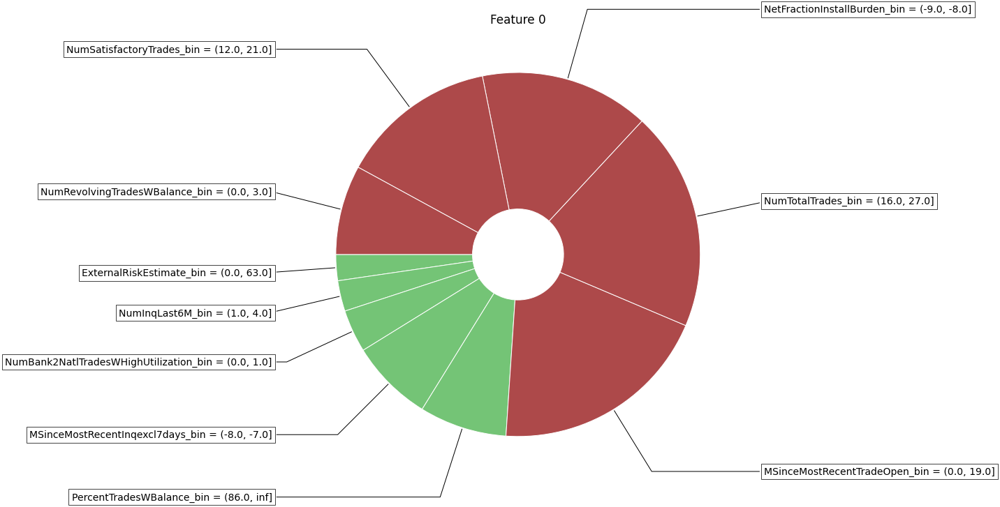

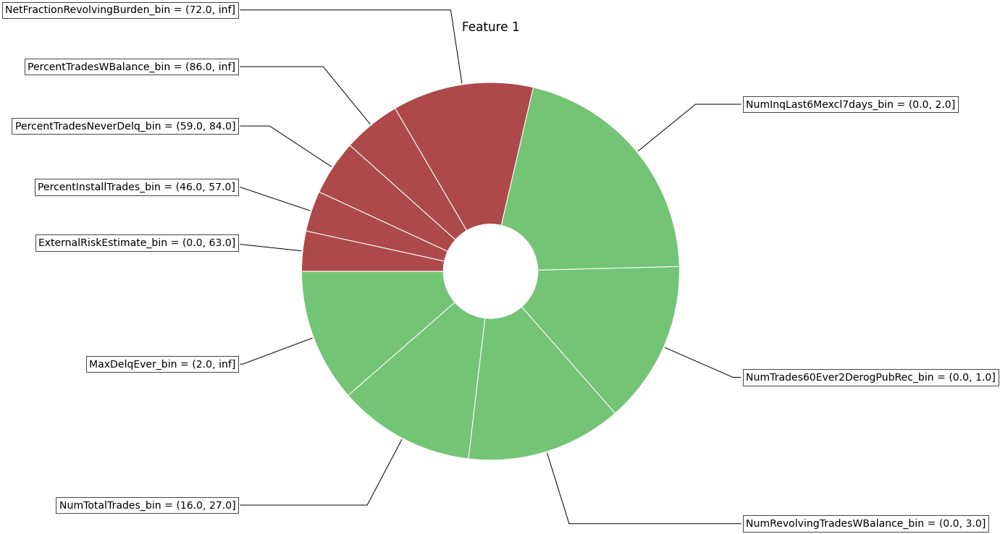

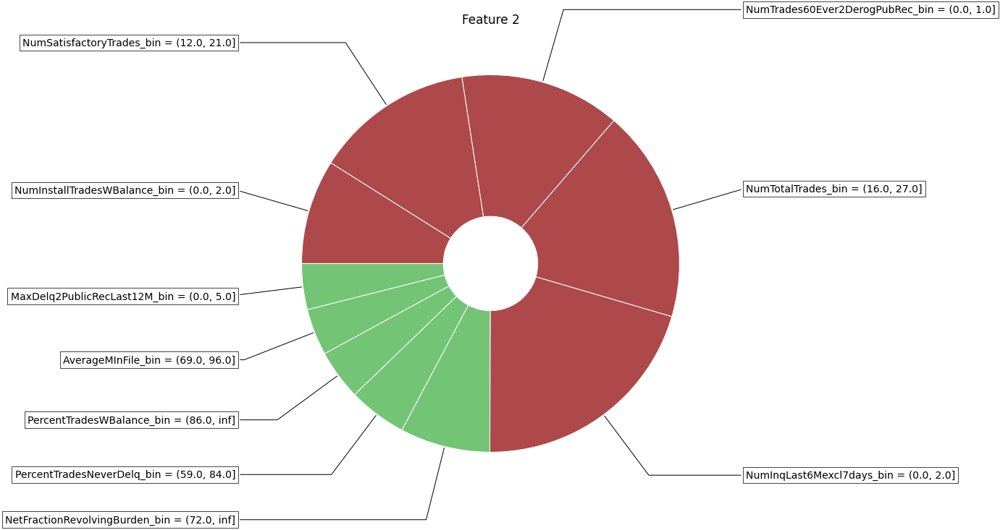

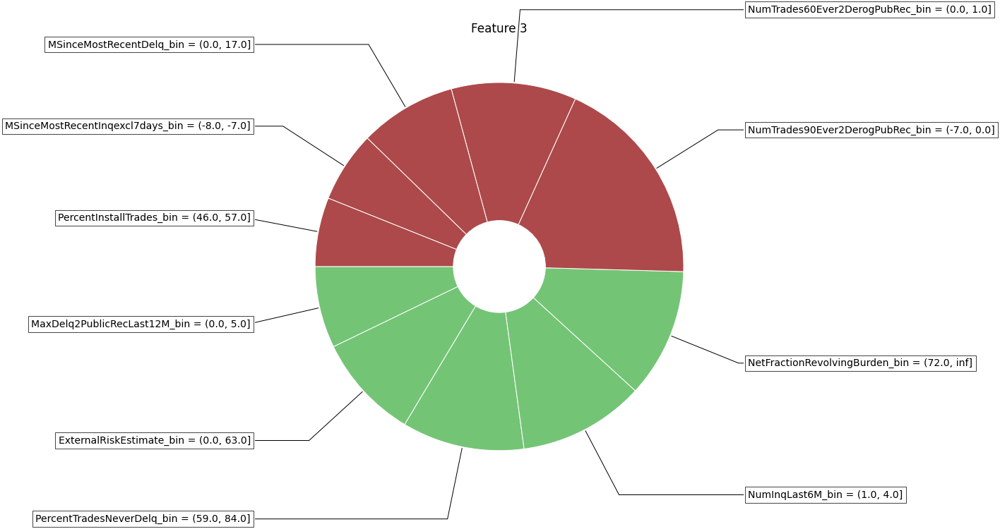

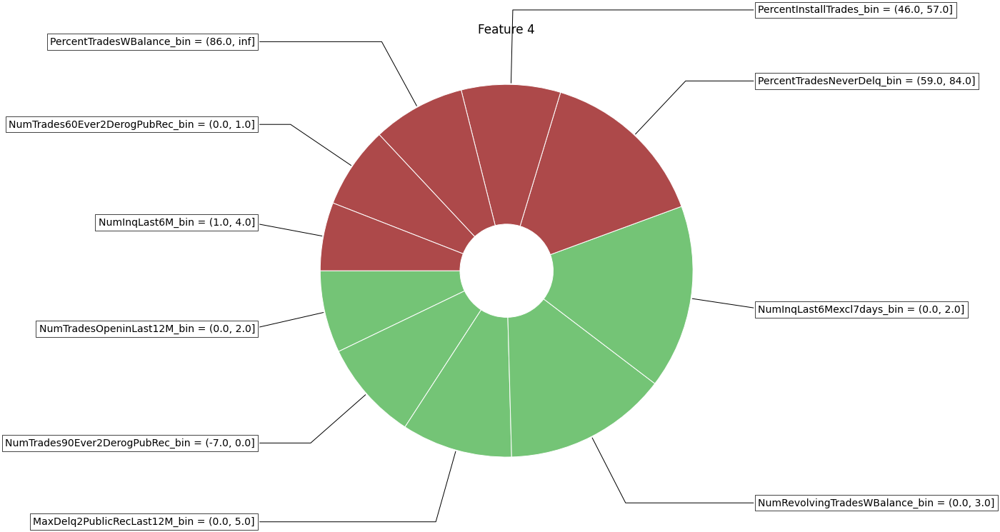

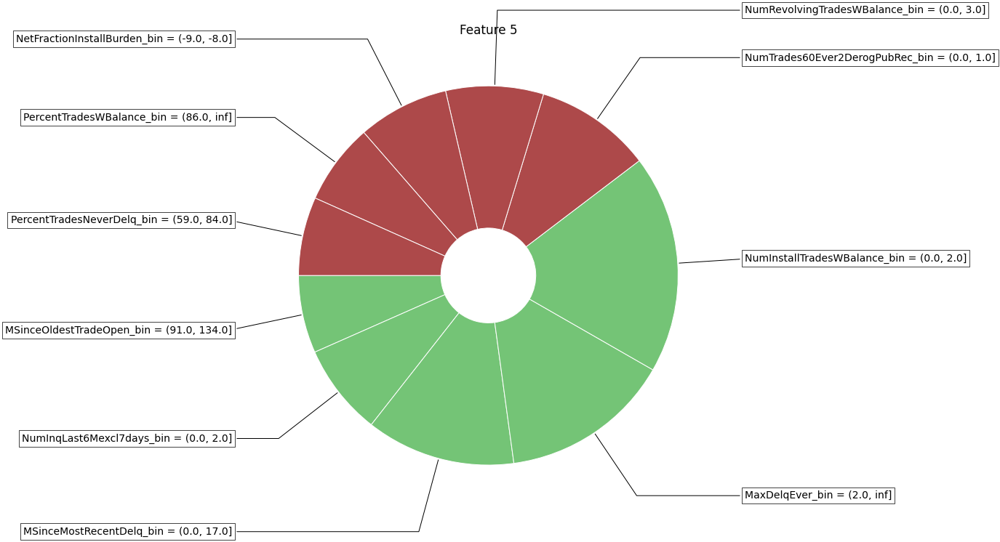

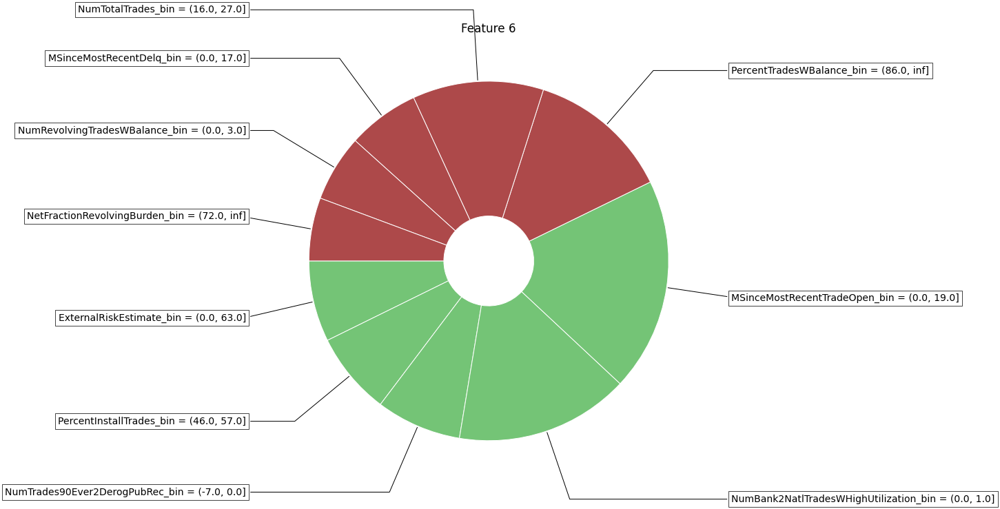

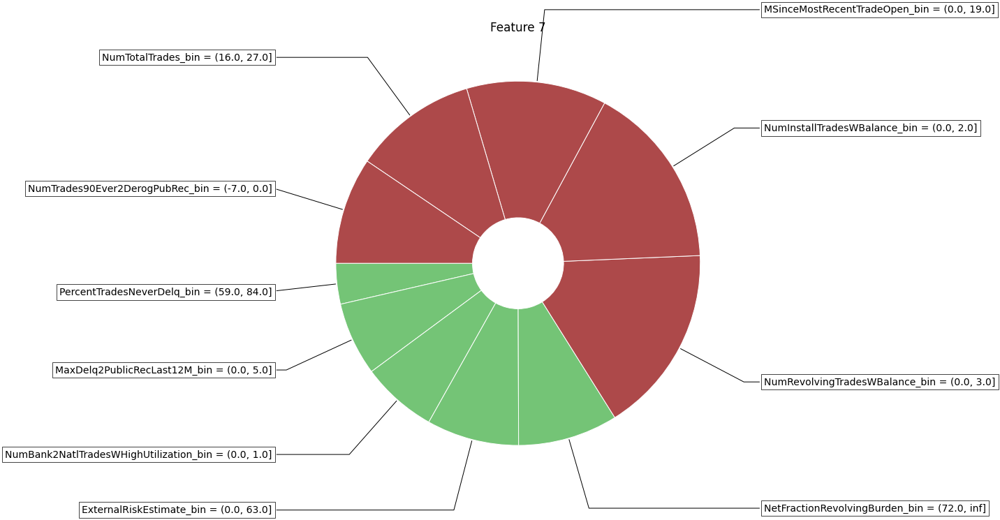

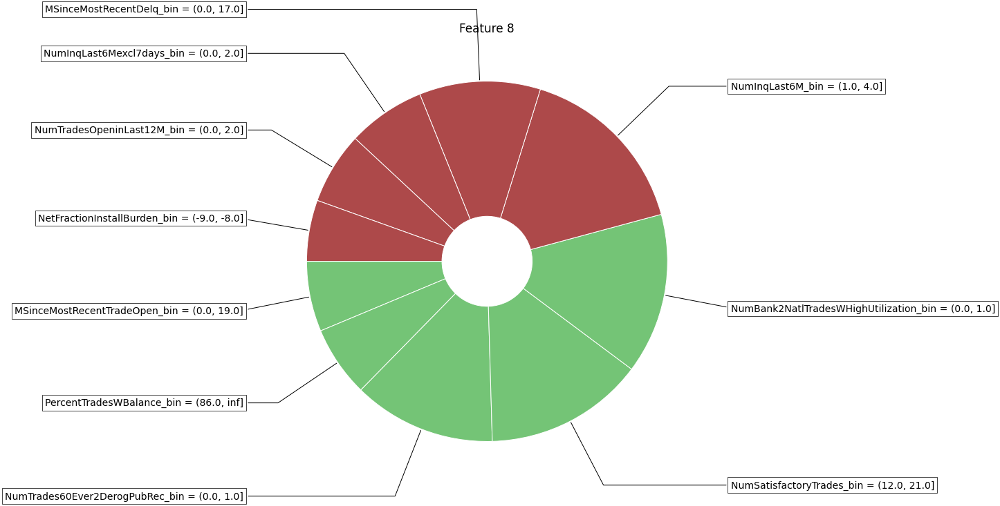

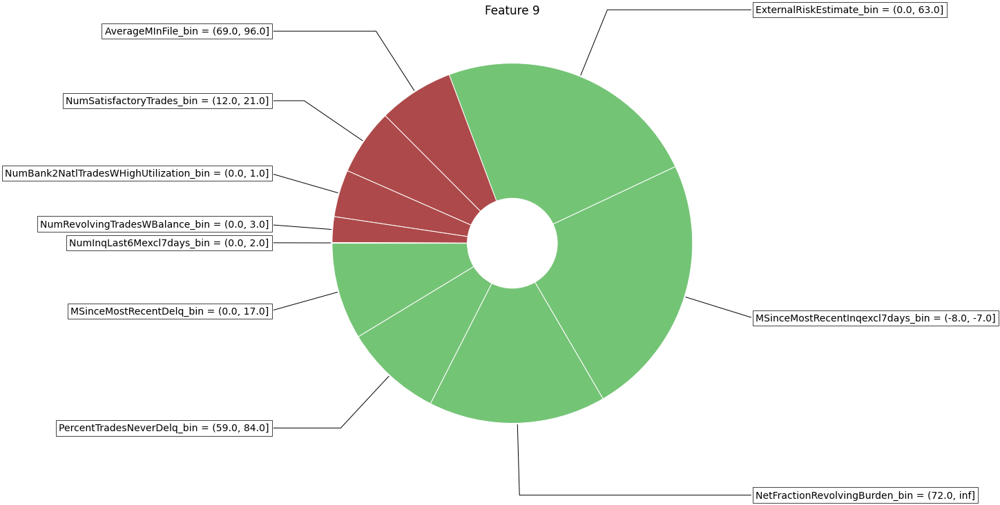

In [82]:
filter_ids = [node for node in G.nodes if G.nodes[node]['level'] == 1]
for feature_idx in filter_ids:
    plt.figure(figsize = [12, 12], frameon = False)
    plot_local(G, feature_idx, top = 5, onlytrue = "Only True", )
    plt.show()

## LRP Investigation

In [43]:
# idx = 329
print(dense_W1)
x_onehot = X_onehot_test.loc[idx].values
get_feature_to_output_relevance(x_onehot)

[[ 0.40030494]
 [-0.6998669 ]
 [ 0.2921789 ]
 [-0.684022  ]
 [-0.32182878]
 [ 0.19920406]
 [ 0.47951484]
 [ 0.5118883 ]
 [ 0.30862808]
 [ 0.6362064 ]]


array([ 0.30793092, -0.        ,  0.15096413, -0.        , -0.00619336,
        0.        ,  0.3344224 ,  0.1307145 ,  0.        ,  0.        ],
      dtype=float32)

### Get features relevance - LRP

In [44]:
activ_list = []
for idx in range(len(X_onehot_test)):
    x_onehot = X_onehot_test.iloc[idx].values
    activ = get_feature_to_output_relevance(x_onehot)
#     prob = model.predict(np.array([x_onehot]))[0][0]
#     if prob>0.5:
    activ_list.append(activ)

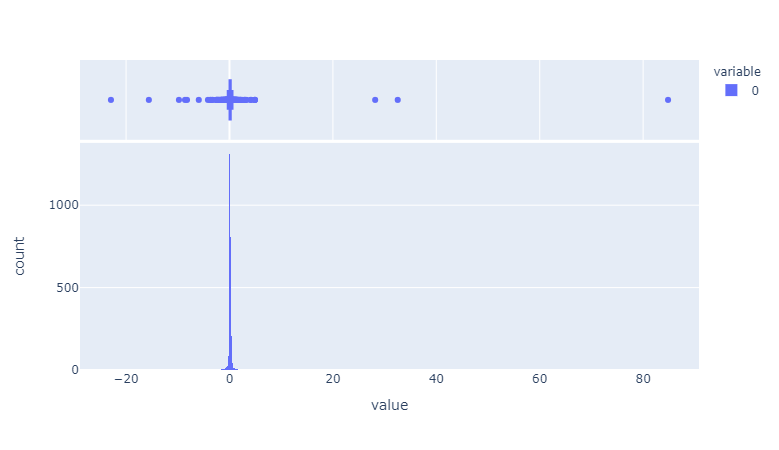

In [45]:
feature_idx = 0
fig = px.histogram([item[feature_idx] for item in activ_list], marginal="box")
fig.show()

which rows have max and min relevance?

In [46]:
import operator
max(enumerate([item[0] for item in activ_list]), key=operator.itemgetter(1))
min(enumerate([item[0] for item in activ_list]), key=operator.itemgetter(1))

(1440, -22.925928)

Explore single accounts activations

In [47]:
idx = 131
# print(dense_W1)
x_onehot = X_onehot_test.loc[idx].values
input_weights_activ = np.transpose(x_onehot*np.transpose(dense_W0))

In [48]:
feat_idx = 0
[item[feat_idx] for item in input_weights_activ if item[feat_idx]]

[0.23289336,
 -0.01384399,
 0.03675298,
 -0.07900557,
 -0.0045435177,
 -0.005098324,
 0.17754759,
 0.11872464,
 0.11982563,
 0.15166256,
 0.01624616,
 0.1649458,
 0.22099172,
 0.11437968,
 0.1587609,
 -0.12757747,
 0.055250634,
 0.18888402,
 -0.04008449,
 0.35892972,
 0.05885382,
 0.020940695,
 0.1279764]

In [49]:
#sum i*w
sum([item[feat_idx] for item in input_weights_activ if item[feat_idx]])

2.0534129538573325

In [50]:
#bias
model.layers[0].get_weights()[1][feat_idx]

0.023870537

In [51]:
#Proportion of active weights at level 0
print([item[feat_idx] for item in input_weights_activ if item[feat_idx]]/(sum([item[feat_idx] for item in input_weights_activ if item[feat_idx]])+model.layers[0].get_weights()[1][feat_idx]))
sum([item[feat_idx] for item in input_weights_activ if item[feat_idx]]/(sum([item[feat_idx] for item in input_weights_activ if item[feat_idx]])+model.layers[0].get_weights()[1][feat_idx]))

[ 0.11211439 -0.00666447  0.01769281 -0.03803312 -0.00218724 -0.00245432
  0.08547105  0.0571538   0.05768381  0.07301005  0.00782087  0.07940457
  0.10638496  0.05506214  0.07642718 -0.06141553  0.02659754  0.09092838
 -0.01929659  0.17278804  0.02833211  0.01008081  0.06160758]


0.9885088207665831

### Replicate LRP feature to output relevance function

In [52]:
idx = 131
# print(dense_W1)
x_onehot = X_onehot_test.loc[idx].values
def get_feature_to_output_rel_man(x_onehot, debug=False, abs=True):
    input_weights_activ = np.transpose(x_onehot*np.transpose(dense_W0))
    
    feats_activated = []
    for feat_idx in range(HIDDEN_LAYERS[0]):
    #     print([item[feat_idx] for item in input_weights_activ if item[feat_idx]])
    #     print(sum([item[feat_idx] for item in input_weights_activ if item[feat_idx]]))

        feat = sum([item[feat_idx] for item in input_weights_activ if item[feat_idx]])

        feat_relu = max(0,feat+model.layers[0].get_weights()[1][feat_idx])
        
        if debug:
            print("hidden",feat)
            print("bias",model.layers[0].get_weights()[1][feat_idx])
            print("activated",feat_relu)
        
        feats_activated.append(feat_relu)
        
    w1 = np.concatenate([np.array(i) for i in model.layers[1].get_weights()[0]])
    w1_b = np.array(model.layers[1].get_weights()[1][0])
    
    if debug:
        print("weights",w1, w1_b)
        print("Activated weights",np.array(feats_activated)*w1)
        print("Sum of activated weights",sum(np.array(feats_activated)*w1,w1_b))
        
    sum_wi = sum(feats_activated*w1,w1_b)
    
    if debug:
        print("Prediction", 1/(1+np.exp(-sum_wi)))
        
    output_rel = model.predict(np.array([x_onehot]))[0][0]
    relevance_weights_num = np.append((feats_activated*w1),np.float(w1_b))
    relevance_weights_den = sum(np.array(feats_activated)*w1,w1_b)
    eps = 1e-7*np.sign(relevance_weights_den)
    
    if abs == True:
        rele = output_rel*relevance_weights_num/np.abs(relevance_weights_den+eps)
    else:
        rele = output_rel*relevance_weights_num/(relevance_weights_den+eps)
    return rele


# sum_wi = sum(feats_activated*w1,w1_b)
# print(1/(1+np.exp(-sum_wi)))
# print(model.predict(np.array([x_onehot]))[0][0] )


In [53]:
activ_list = []
for idx in range(len(X_onehot_test)):
    x_onehot = X_onehot_test.iloc[idx].values
    activ = get_feature_to_output_rel_man(x_onehot, abs = False)
#     prob = model.predict(np.array([x_onehot]))[0][0]
#     if prob>0.5:
    activ_list.append(activ)

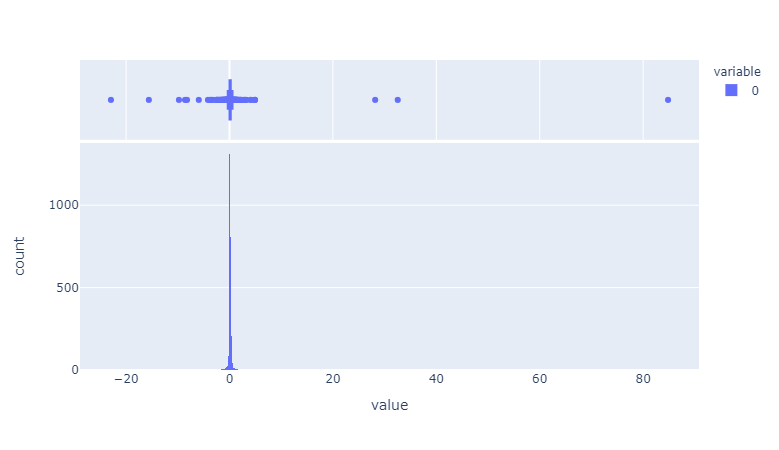

In [54]:
feature_idx = 0
fig = px.histogram([item[feature_idx] for item in activ_list], marginal="box")
fig.show()

## Relvance input to output

First using LRP

get_input_to_output_relevance()

In [55]:
input_activ_list = []
for idx in range(len(X_onehot_test)):
    x_onehot = X_onehot_test.iloc[idx].values
    activ = get_input_to_output_relevance(x_onehot)
    input_activ_list.append(activ)
input_activ_df = pd.DataFrame(np.array(input_activ_list)).T

probs = []
for idx in range(len(X_onehot_test)):
    x_onehot = X_onehot_test.iloc[idx].values
    prob = model.predict(np.array([x_onehot]))[0][0]
    probs.append(prob)

prob_row = pd.DataFrame(probs).T
prob_row.index = ['prob']
input_activ_df = input_activ_df.append(prob_row)


### Function to plot distribution of relevance score across different bins of a variable

In [56]:
# input_idx = 4
# print(X_onehot_test.columns.values[input_idx])

# for colnames  in X.columns.values:
def plot_relevances_for_col(col_idx, select = None, hist = False, split_prob= False):
#     select = None
#     hist = False
#     col_idx = 0

    colnames = X.columns.values[col_idx]
    colnames_onehot = X_onehot_test.columns.values
    colnames_onehot_sub = [s for s in colnames_onehot if colnames in s]
    col_idxs = []
    for s in range(len(colnames_onehot_sub)):
        sub_idx = np.where(colnames_onehot == colnames_onehot_sub[s])[0][0]
    #     dist = [item[sub_idx] for item in input_activ_list if item[sub_idx]]
        col_idxs.append(sub_idx)

    if split_prob == True:
        col_idxs.append('prob')
    print(colnames)
    print(col_idxs)
    
    val_list = []
    for input_name in colnames_onehot_sub:
        val = '('+input_name.split('_(')[-1]
        val_list.append(val)
        
    print(val_list)

    sub_input = input_activ_df.T[col_idxs]

    sub_input = sub_input.replace(['0', 0], np.nan)

    if select is not None:
        sub_input = pd.DataFrame(sub_input[select])
        # print(val_list[select]) 
        sub_input.columns = [val_list[select]]
    elif split_prob == True:
        sub_input.columns = val_list+['prob']
        sub_input = pd.melt(sub_input.reset_index(),id_vars=['index','prob'])

        # sub_input['prob'] = round(sub_input['prob'],1)
        sub_input['prob > 0.5'] = sub_input['prob'] > 0.5    
    else:
        sub_input.columns = val_list
        sub_input = pd.melt(sub_input)

    sub_input

    import plotly
    import plotly.express as px

    if split_prob == True:
        fig = px.box(sub_input, x="variable", y="value", color = 'prob > 0.5'
    #                  , points=False
                )
    else:
        fig = px.box(sub_input, x="variable", y="value")
    
    fig.update_traces(quartilemethod="exclusive")

    if hist is True:
        fig = px.histogram(sub_input, x="value", nbins=20)
    # plotly.offline.plot(fig)
    fig.show()

ExternalRiskEstimate
[0, 1, 2, 3, 4, 5, 6, 7, 8, 'prob']
['(-inf, -9.0]', '(-9.0, -8.0]', '(-8.0, -7.0]', '(-7.0, 0.0]', '(0.0, 63.0]', '(63.0, 70.0]', '(70.0, 75.0]', '(75.0, 80.0]', '(80.0, inf]']


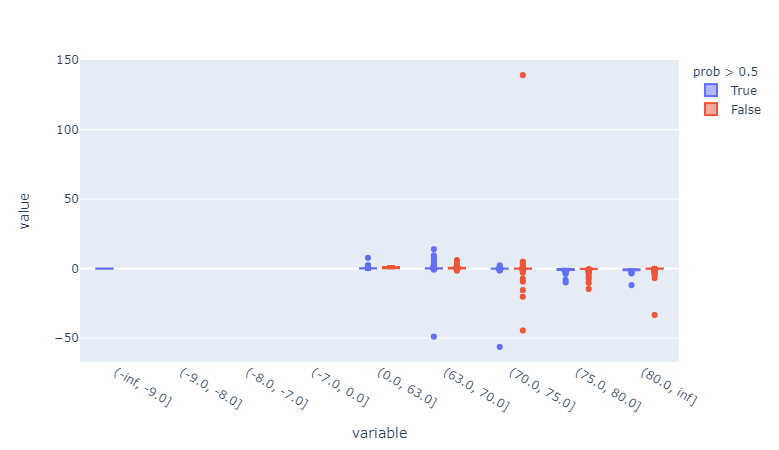

In [62]:
plot_relevances_for_col(0, select = None, hist = False, split_prob = True)

### Replicate LRP input to output relevance

Insert an option to add an absolute value for the denominator of the weighting factors

abs = True

In [57]:
idx = 131
# print(dense_W1)
x_onehot = X_onehot_test.loc[idx].values

# abs = False

def get_input_to_output_rel_man(x_onehot, debug=False, abs=True):

    input_weights_activ = np.transpose(x_onehot*np.transpose(dense_W0))

    feats_activated = []
    for feat_idx in range(HIDDEN_LAYERS[0]):

        feat = sum([item[feat_idx] for item in input_weights_activ if item[feat_idx]])

        feat_relu = max(0,feat+model.layers[0].get_weights()[1][feat_idx])

        if debug:
            print("hidden",feat)
            print("bias",model.layers[0].get_weights()[1][feat_idx])
            print("activated",feat_relu)

        feats_activated.append(feat_relu)

    w1 = np.concatenate([np.array(i) for i in model.layers[1].get_weights()[0]])
    w1_b = np.array(model.layers[1].get_weights()[1][0])

    if debug:
        print("weights",w1, w1_b)
        print("Activated weights",np.array(feats_activated)*w1)
        print("Sum of activated weights",sum(np.array(feats_activated)*w1,w1_b))

    sum_wi = sum(feats_activated*w1,w1_b)

    if debug:
        print("Prediction", 1/(1+np.exp(-sum_wi)))

    output_rel = model.predict(np.array([x_onehot]))[0][0]
    relevance_weights_num = np.append((feats_activated*w1),np.float(w1_b))
    relevance_weights_den = sum(relevance_weights_num)
    eps = 1e-7*np.sign(relevance_weights_den)

    if abs == True:
        rele = output_rel*relevance_weights_num/np.abs(relevance_weights_den+eps)
    else:
        rele = output_rel*relevance_weights_num/(relevance_weights_den+eps)

    feats_reles = []
    for feat_idx in range(HIDDEN_LAYERS[0]):
        relevance_weights0_num = [item[feat_idx] for item in input_weights_activ]
        relevance_weights0_den = sum(relevance_weights0_num)
        eps = 1e-7*np.sign(relevance_weights0_den)

        if abs == True:
            rele0 = rele[feat_idx]*np.array(relevance_weights0_num)/np.abs(relevance_weights0_den+eps)
        else:
            rele0 = rele[feat_idx]*np.array(relevance_weights0_num)/(relevance_weights0_den+eps)

        feats_reles.append(rele0)

    rele0 = sum(feats_reles)

    return rele0

In [58]:
input_activ_list = []
for idx in range(len(X_onehot_test)):
    x_onehot = X_onehot_test.iloc[idx].values
    activ = get_input_to_output_rel_man(x_onehot, abs=True)
    input_activ_list.append(activ)
input_activ_df = pd.DataFrame(np.array(input_activ_list)).T

probs = []
for idx in range(len(X_onehot_test)):
    x_onehot = X_onehot_test.iloc[idx].values
    prob = model.predict(np.array([x_onehot]))[0][0]
    probs.append(prob)

prob_row = pd.DataFrame(probs).T
prob_row.index = ['prob']
input_activ_df = input_activ_df.append(prob_row)


ExternalRiskEstimate
[0, 1, 2, 3, 4, 5, 6, 7, 8, 'prob']
['(-inf, -9.0]', '(-9.0, -8.0]', '(-8.0, -7.0]', '(-7.0, 0.0]', '(0.0, 63.0]', '(63.0, 70.0]', '(70.0, 75.0]', '(75.0, 80.0]', '(80.0, inf]']


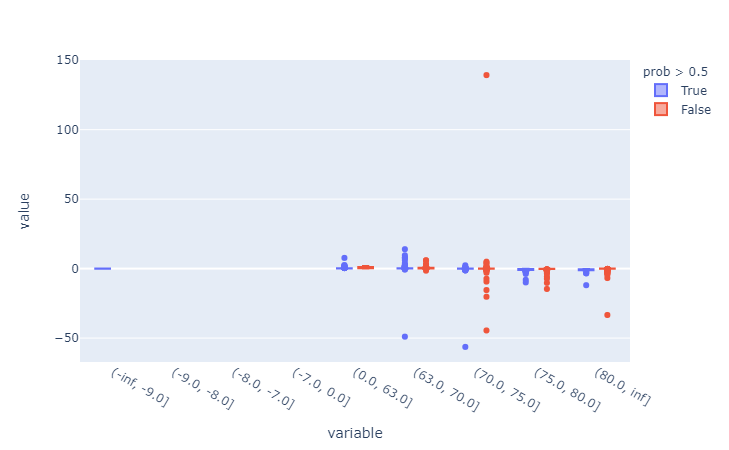

In [61]:
# input_idx = 4
# print(X_onehot_test.columns.values[input_idx])

# for colnames  in X.columns.values:
plot_relevances_for_col(0, select = None, hist = False, split_prob = True)


ExternalRiskEstimate
[0, 1, 2, 3, 4, 5, 6, 7, 8]
['(-inf, -9.0]', '(-9.0, -8.0]', '(-8.0, -7.0]', '(-7.0, 0.0]', '(0.0, 63.0]', '(63.0, 70.0]', '(70.0, 75.0]', '(75.0, 80.0]', '(80.0, inf]']


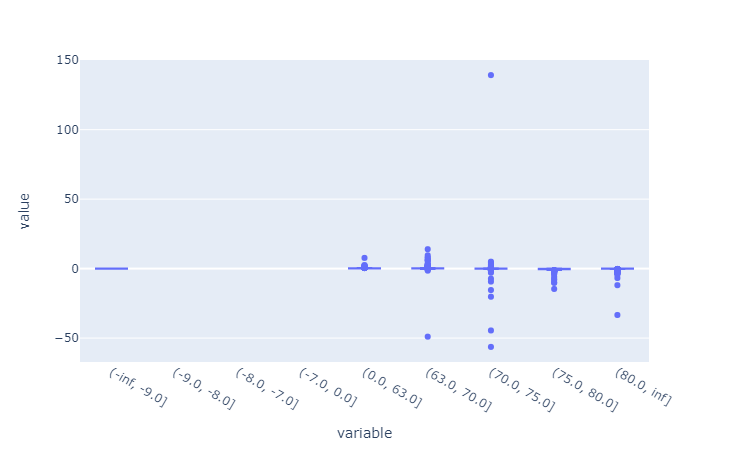

In [60]:
plot_relevances_for_col(0, select = None, hist = False, split_prob = False)

# Statistics

In [ ]:
from collections import Counter
from tqdm import tqdm

def count_relations(idx, **args):
    G, _, _ = generate_af_counterfactual(idx, **args)
    counter = Counter([str(G.edges[edge]['level']) + G.edges[edge]['type'] for edge in G.edges])
    for filter_idx in [edge[1] for edge in G.edges if G.edges[edge]['type'] == CRITICAL_SUPPORT and G.edges[edge]['level'] == 0]:
        if filter_idx in [edge[0] for edge in G.edges if G.edges[edge]['type'] == CRITICAL_SUPPORT and G.edges[edge]['level'] == 1]:
            counter.update(['!!+'])
    return counter
 
stats = pd.DataFrame([count_relations(idx) for idx in tqdm(X_test.index)]).fillna(0)

In [ ]:
# Select nice sample to be shown as examples
display(stats.describe())
candidates = stats[(stats['!!+'] >= 1) ]
display(candidates)

In [ ]:
test_prop = []
for idx in X_test.index[candidates.index]:
    x_onehot = X_onehot_test.loc[idx].values
    prob = model.predict(np.array([x_onehot]))[0][0] 
    test_prop.append((idx,prob))
test_prop

In [ ]:
list(map(min, zip(*test_prop))) 

In [ ]:
idx = X_test.index[228]